# Transcription Factor Project - MDE and Cluster Membership Testing
**Robin Anwyl, UCSD Subramaniam Lab**

**Project Goal:** Analyze the hiPSC Perturb-seq dataset from the Mali lab (Nourreddine et al preprint) to investigate the effects of transcription factor knockouts (TF KOs)

**Notebook Description:** 
-  Dataset: QC-passed TF KO dataset; feature selection was performed two ways (option 1: DEGs with |LFC| > 0.25 and p-adj < 0.05, option 2: 2000 HVGs), resulting in dataset adata_5087 (TF KO cells x 5087 DEGs) and adata_2000 (TF KO cells x 2000 HVGs)
-  Analysis:
    -  Minimal distortion embedding (MDE) using different numbers of k-nearest neighbors for Leiden clustering
    -  Cluster membership comparison between DEG MDE and HVG MDE, using Jaccard index and set intersection
    -  Cluster membership comparison between DEG MDE, HVG MDE, and Mali lab study MDE
    -  Cluster membership comparison between 2008 DEG MDE and 2000 HVG MDE
***

In [1]:
# import muon as mu
import anndata as ad
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib_venn import venn2
# import scipy as sp
import gc
#from plotnine import ggplot, aes, geom_bar, ggtitle, xlab, ylab, scale_fill_manual, geom_histogram, labs, theme, element_text, scale_y_continuous
#from sklearn.ensemble import IsolationForest
#from sklearn.svm import OneClassSVM
# from tqdm.auto import tqdm
# from statsmodels.stats.multitest import multipletests
# from scipy.stats import mannwhitneyu
# from scipy.stats import ks_2samp
# from scipy.stats import gamma
# from scipy.stats import spearmanr
import seaborn as sns
#import dcor
# from joblib import Parallel, delayed
# from tqdm import tqdm
# from tqdm_joblib import tqdm_joblib
# import networkx as nx
# from pydeseq2.dds import DeseqDataSet
# from pydeseq2.ds import DeseqStats
# from pydeseq2.default_inference import DefaultInference
import pickle as pkl
#import openpyxl
from IPython.display import display  #type: ignore
from scipy.spatial.distance import pdist, squareform #type: ignore
import plotly.express as px #type: ignore
import plotly.graph_objects as go #type: ignore
import pymde #type: ignore
import plotly.io as pio #type: ignore
from sklearn.preprocessing import StandardScaler #type: ignore
from sklearn.neighbors import kneighbors_graph #type: ignore
from sklearn.manifold import SpectralEmbedding
import igraph as ig #type: ignore
import leidenalg #type: ignore
import sys
import os
sys.path.insert(0, "/home/ranwyl/data_tf_project/")
import perturb_seq_heuristic_pipeline as qc
import pan_genome_analysis_functions as qc2

# Testing feature selection

Note: 6/4/25 and 6/5/25 realized two previous errors. Made copy of "tf_project_analysis" notebook and renamed the copy "tf_project_analysis_old," then edited code in "tf_project_analysis" notebook.
-  Previously I was trying to filter genes that were present in fewer than 25 cells. This was actually not done as part of the Mali lab pipeline. Additionally, scanpy's filter_genes() is performed on the X matrix of the AnnData object and expects raw counts, but the X matrix of my TF KO dataset was composed of relative z-normalized counts, so I was not actually filtering genes present in fewer than 25 cells. I have now removed this code.
-  In the DE results file I was using, "TF_KO_NTC_DE_results.pkl", some of the genes that were listed by Ensembl ID in the dataset were renamed to gene names. This means that not all of the DEGs from the results file were found in the dataset. I have now changed the code so the DE results file that will be used is "TF_KO_NTC_DE_results_shrunk_adaptFalse.pkl"

## Testing feature selection - filtering genes with lowest expression or not expressed in a minimum number of cells

In [2]:
adata_tfs = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_TF_KO_Batch_Normalized.h5ad")

In [3]:
# DE results
de_results = pd.read_pickle("/home/ranwyl/results_tf_project/old_TF_KO_NTC_DE_results_shrunk_adaptFalse.pkl")
de_results.head()

,DMRT2_baseMean,DMRT2_log2FoldChange,DMRT2_lfcSE,DMRT2_stat,DMRT2_pvalue,DMRT2_padj,OSR2_baseMean,OSR2_log2FoldChange,OSR2_lfcSE,OSR2_stat,...,ZBED6_lfcSE,ZBED6_stat,ZBED6_pvalue,ZBED6_padj,FAM200B_baseMean,FAM200B_log2FoldChange,FAM200B_lfcSE,FAM200B_stat,FAM200B_pvalue,FAM200B_padj
A1BG,5.197361,0.603388,0.610262,1.249251,0.211573,NaN,3.271476,-0.219247,0.719732,-0.436204,...,0.928560,-1.333630,0.182325,0.93709,3.431164,-0.557770,0.756780,-1.045982,0.295569,0.943485
A1BG-AS1,2.117718,0.544581,0.911720,0.986719,0.323780,NaN,0.659727,-0.021330,1.140542,-0.048274,...,1.246887,-0.863337,0.387952,0.93709,0.627773,-0.762906,1.404104,-1.112549,0.265902,0.943485
A1CF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
A2M,0.349860,-0.390388,1.225741,-0.692164,0.488835,NaN,0.826464,-0.187075,1.073352,-0.401825,...,1.930966,1.844563,0.065101,0.93709,0.643332,0.025018,1.154267,0.060363,0.951867,0.979964
A2M-AS1,0.311871,0.340470,1.828676,0.582373,0.560315,NaN,0.976668,0.678086,1.342768,1.186024,...,1.135588,-0.197266,0.843620,0.93709,0.823219,0.181208,1.157592,0.401337,0.688172,0.943485


In [4]:
def filter_low_expressed_genes(adata, layer="counts", percent_threshold=None, min_n_cells=None):
    n_genes_before = adata.shape[1]
    data_matrix = adata.layers[layer] if layer in adata.layers else adata.layers["counts"]
    # Convert from sparse to dense if necessary
    if hasattr(data_matrix, 'toarray'):
        data_matrix = data_matrix.toarray()
    
    # Filter genes expressed in fewer than min_n_cells cells
    if min_n_cells:
        gene_detected_counts = (data_matrix > 0).sum(axis=0)
        genes_pass_cell_thr = gene_detected_counts >= min_n_cells
        data_matrix = data_matrix[:, genes_pass_cell_thr].copy()
        adata = adata[:,genes_pass_cell_thr].copy()

    if percent_threshold:
        if layer == "counts":
            # Take column sums
            col_values = data_matrix.sum(axis=0)
        elif layer == "pre_z_normalization":
            # Calculate mean per-gene expression
            col_values = data_matrix.mean(axis=0)
        # Set percent threshold and filter genes
        threshold = np.percentile(col_values, percent_threshold)
        genes_to_keep = col_values > threshold
        adata = adata[:,genes_to_keep].copy()
    
    print(f"Removed {n_genes_before - adata.shape[1]} genes")
    return adata

def hvg_selection(adata, method="seurat_v3"):
    adata_copy = adata.copy()
    if method == "seurat_v3":
        sc.pp.highly_variable_genes(adata_copy, n_top_genes=2000, subset=True, 
                                    flavor=method, layer="counts")
    elif method == "cell_ranger":
        sc.pp.highly_variable_genes(adata_copy, n_top_genes=2000, subset=True, 
                                    flavor=method, layer="pre_z_normalization")
    hvg_set = set(adata_copy.var.index.tolist())
    return hvg_set

In [5]:
def filter_degs_padj(deg_df, lfc_threshold=0.25, padj_threshold=0.05):
    # Get list of perturbations from column labels
    perts = {col.split("_")[0] for col in deg_df.columns}
    # Get genes where |L2FC| > threshold and p-adj < threshold
    lfc_degs_set = set()
    for pert in perts:
        l2fc_col = f"{pert}_log2FoldChange"
        padj_col = f"{pert}_padj"
        lfc_degs_set.update(deg_df.loc[(abs(deg_df[l2fc_col]) > lfc_threshold) 
                                   & (deg_df[padj_col] < padj_threshold)].index)
    return lfc_degs_set

def filter_degs_pval(de_df, lfc_threshold=0.25, pval_threshold=0.05, tf_ko_list=None):
    if not tf_ko_list:
        # Get list of perturbations from column labels
        perts = {col.split("_")[0] for col in de_df.columns}
    else:
        perts = tf_ko_list
    # Get genes where |L2FC| > threshold and p-adj < threshold
    deg_set = set()
    for pert in perts:
        l2fc_col = f"{pert}_log2FoldChange"
        pval_col = f"{pert}_pvalue"
        deg_set.update(de_df.loc[(abs(de_df[l2fc_col]) > lfc_threshold) 
                                   & (de_df[pval_col] < pval_threshold)].index)
    return deg_set

degs_padj = filter_degs_padj(de_results, padj_threshold=0.05)
degs_pval = filter_degs_pval(de_results, pval_threshold=0.0005)

In [6]:
def get_degs_hvgs(adata, filt_layer=None, percent_thr=None, n_cells_thr=None, 
                  hvg_method="seurat_v3", padj_or_pval="padj",
                  degs_padj_set=None, degs_pval_set=None):
    # Filter genes
    if filt_layer:
        genes_before = set(adata.var.index.tolist())
        adata = filter_low_expressed_genes(adata, filt_layer, 
                                           percent_threshold=percent_thr, 
                                           min_n_cells=n_cells_thr)
        genes_rm = genes_before - set(adata.var.index.tolist())
    
    # HVGs
    hvg_set = hvg_selection(adata, hvg_method)
    # DEGs
    if padj_or_pval == "padj":
        if not degs_padj_set:
            deg_set = filter_degs_padj(de_results, padj_threshold=0.05)
        else:
            deg_set = degs_padj_set
    elif padj_or_pval == "pval":
        if not degs_pval_set:
            deg_set = filter_degs_pval(de_results, pval_threshold=0.0005)
        else:
            deg_set = degs_pval_set
    if filt_layer:
        deg_set = deg_set - genes_rm
    
    n_shared_genes = len([g for g in hvg_set if g in deg_set])
    print(f"{len(deg_set)} DEGs, {len(hvg_set)} HVGs, {n_shared_genes} shared genes")
    return deg_set, hvg_set, adata

In [7]:
def plot_venn(gene_set1, gene_set2, label1, label2, title=None, color1="red", color2="green"):
    plt.rcParams['font.size'] = 18
    n_genes1, n_genes2 = len(gene_set1), len(gene_set2)
    n_shared_genes = len([g for g in gene_set2 if g in gene_set1])
    left = n_genes1 - n_shared_genes
    right = n_genes2 - n_shared_genes
    venn2(subsets = (left, right, n_shared_genes), 
        set_labels = (label1, label2),
        set_colors = (color1, color2),
        alpha=0.4)
    if title:
        plt.title(title)
    plt.show()

In [8]:
def histogram_lowest_expression_genes(adata, title="Histogram of Mean Gene Expression", 
                                      n_bins=75, ymax=None, show_labels=False):
    plt.rcParams['font.size'] = 14
    data_matrix = adata.layers["pre_z_normalization"]
    # Convert from sparse to dense if necessary
    if hasattr(data_matrix, 'toarray'):
        data_matrix = data_matrix.toarray()
    mean_expr = data_matrix.mean(axis=0)
    plt.figure(figsize=(8,4)) if show_labels else plt.figure(figsize=(6,4))
    ax = sns.histplot(mean_expr, bins=n_bins, kde=False)
    plt.xlabel("Mean expression per gene (norm and log1p)")
    plt.ylabel("Number of genes")
    plt.title(title, fontsize=15)
    if ymax:
        ax.set_ylim(0, ymax)
    if show_labels:
        ax.bar_label(ax.containers[0], rotation=90, padding=3, fontsize=10)
    plt.tight_layout()
    plt.show()

def histogram_cells_expressing_gene(adata, title="Histogram of # Cells Expressing a Gene", 
                                    n_bins=75, ymax=None, show_labels=False):
    plt.rcParams['font.size'] = 14
    count_matrix = adata.layers["counts"]
    # Convert from sparse to dense if necessary
    if hasattr(count_matrix, 'toarray'):
        count_matrix = count_matrix.toarray()
    gene_detected_counts = (count_matrix > 0).sum(axis=0)
    plt.figure(figsize=(8,4)) if show_labels else plt.figure(figsize=(6,4))
    ax = sns.histplot(gene_detected_counts, bins=n_bins, kde=False)
    plt.xlabel("Number of cells in which gene is expressed")
    plt.ylabel("Number of genes")
    plt.title(title, fontsize=15)
    if ymax:
        ax.set_ylim(0, ymax)
    if show_labels:
        ax.bar_label(ax.containers[0], rotation=90, padding=3, fontsize=10)
    plt.tight_layout()
    plt.show()

In [9]:
adata_tfs

AnnData object with n_obs × n_vars = 31808 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

### DEGs based on p-val

In [5]:
# res_counts_10pct_1cell_seurat_pval = \
#     get_degs_hvgs(adata_tfs, filt_layer="counts", percent_thr=10, n_cells_thr=None, 
#                   hvg_method="seurat_v3", padj_or_pval="pval",
#                   degs_padj_set=degs_padj, degs_pval_set=degs_pval)

In [6]:
# res_counts_20pct_1cell_seurat_pval = \
#     get_degs_hvgs(adata_tfs, filt_layer="counts", percent_thr=20, n_cells_thr=None, 
#                   hvg_method="seurat_v3", padj_or_pval="pval",
#                   degs_padj_set=degs_padj, degs_pval_set=degs_pval)

In [7]:
# res_counts_10cells_seurat_pval = \
#     get_degs_hvgs(adata_tfs, filt_layer="counts", percent_thr=None, n_cells_thr=10, 
#                   hvg_method="seurat_v3", padj_or_pval="pval",
#                   degs_padj_set=degs_padj, degs_pval_set=degs_pval)

In [8]:
# res_counts_30cells_seurat_pval = \
#     get_degs_hvgs(adata_tfs, filt_layer="counts", percent_thr=None, n_cells_thr=30, 
#                   hvg_method="seurat_v3", padj_or_pval="pval",
#                   degs_padj_set=degs_padj, degs_pval_set=degs_pval)

In [9]:
# res_counts_50cells_seurat_pval = \
#     get_degs_hvgs(adata_tfs, filt_layer="counts", percent_thr=None, n_cells_thr=50, 
#                   hvg_method="seurat_v3", padj_or_pval="pval",
#                   degs_padj_set=degs_padj, degs_pval_set=degs_pval)

In [10]:
# res_counts_10pct_10cells_seurat_pval = \
#     get_degs_hvgs(adata_tfs, filt_layer="counts", percent_thr=10, n_cells_thr=10, 
#                   hvg_method="seurat_v3", padj_or_pval="pval",
#                   degs_padj_set=degs_padj, degs_pval_set=degs_pval)

In [151]:
res_counts_20pct_10cells_seurat_pval = \
    get_degs_hvgs(adata_tfs, filt_layer="counts", percent_thr=20, n_cells_thr=10, 
                  hvg_method="seurat_v3", padj_or_pval="pval",
                  degs_padj_set=degs_padj, degs_pval_set=degs_pval)

Removed 15615 genes
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
5564 DEGs, 2000 HVGs, 1052 shared genes


In [ ]:
title = 'Removed 20% lowest expr genes and \ngenes expr in < 10 cells (15615 genes)\nDEGs chosen with p-val cutoff'
label1 = '5564 DEGs\n|LFC| > 0.25\np-val < 0.0005'
label2 = '2000 HVGs'
plot_venn(res_counts_20pct_10cells_seurat_pval[0], 
          res_counts_20pct_10cells_seurat_pval[1], 
          label1, label2, title)

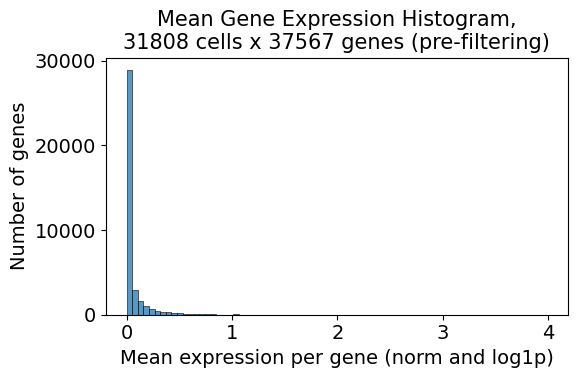

In [126]:
histogram_lowest_expression_genes(adata_tfs, 
title="Mean Gene Expression Histogram,\n31808 cells x 37567 genes (pre-filtering)")

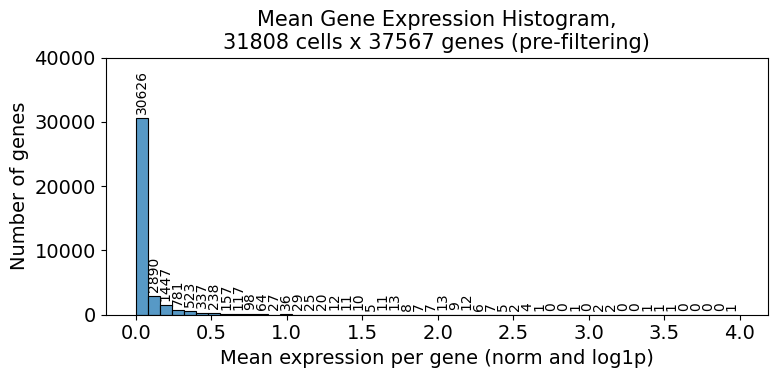

In [ ]:
histogram_lowest_expression_genes(adata_tfs, 
    title="Mean Gene Expression Histogram,\n31808 cells x 37567 genes (pre-filtering)", 
    n_bins=50, show_labels=True, ymax=40000)

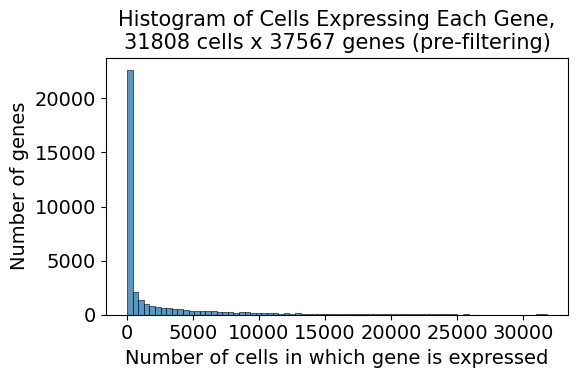

In [83]:
histogram_cells_expressing_gene(adata_tfs, 
                                title="Histogram of Cells Expressing Each Gene,\n31808 cells x 37567 genes (pre-filtering)")

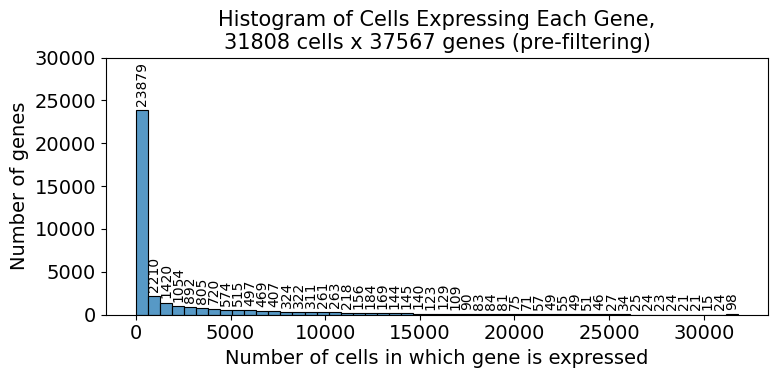

In [116]:
histogram_cells_expressing_gene(adata_tfs, 
    title="Histogram of Cells Expressing Each Gene,\n31808 cells x 37567 genes (pre-filtering)",
    n_bins=50, show_labels=True, ymax=30000)

In [63]:
res_norm_20pct_30cells_seurat_pval = \
    get_degs_hvgs(adata_tfs, filt_layer="pre_z_normalization", percent_thr=20, n_cells_thr=30, 
                  hvg_method="seurat_v3", padj_or_pval="pval",
                  degs_padj_set=degs_padj, degs_pval_set=degs_pval)

Removed 18428 genes
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
5557 DEGs, 2000 HVGs, 1214 shared genes


In [146]:
res_norm_20pct_60cells_seurat_pval = \
    get_degs_hvgs(adata_tfs, filt_layer="pre_z_normalization", percent_thr=20, n_cells_thr=60, 
                  hvg_method="seurat_v3", padj_or_pval="pval",
                  degs_padj_set=degs_padj, degs_pval_set=degs_pval)

Removed 20374 genes
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
5533 DEGs, 2000 HVGs, 1291 shared genes


In [147]:
_, _, adata_norm_20pct_60cells_seurat_pval = res_norm_20pct_60cells_seurat_pval
adata_norm_20pct_60cells_seurat_pval.shape

(31808, 17193)

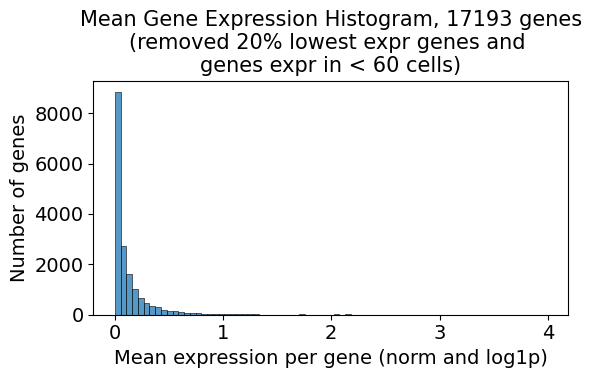

In [148]:
histogram_lowest_expression_genes(
    adata_norm_20pct_60cells_seurat_pval, 
    title="Mean Gene Expression Histogram, 17193 genes\n(removed 20% lowest expr genes and \ngenes expr in < 60 cells)"
    )

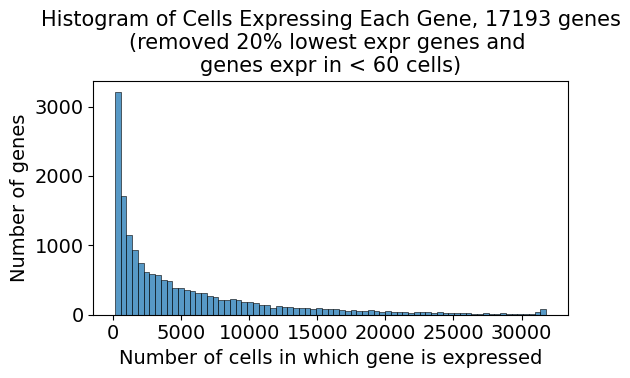

In [149]:
histogram_cells_expressing_gene(
    adata_norm_20pct_60cells_seurat_pval, 
    title="Histogram of Cells Expressing Each Gene, 17193 genes\n(removed 20% lowest expr genes and \ngenes expr in < 60 cells)")

In [127]:
res_norm_30pct_75cells_seurat_pval = \
    get_degs_hvgs(adata_tfs, filt_layer="pre_z_normalization", percent_thr=30, n_cells_thr=75, 
                  hvg_method="seurat_v3", padj_or_pval="pval",
                  degs_padj_set=degs_padj, degs_pval_set=degs_pval)

Removed 23079 genes
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
5461 DEGs, 2000 HVGs, 1399 shared genes


In [128]:
_, _, adata_norm_30pct_75cells_seurat_pval = res_norm_30pct_75cells_seurat_pval
adata_norm_30pct_75cells_seurat_pval.shape

(31808, 14488)

In [131]:
res_norm_30pct_90cells_seurat_pval = \
    get_degs_hvgs(adata_tfs, filt_layer="pre_z_normalization", percent_thr=30, n_cells_thr=90, 
                  hvg_method="seurat_v3", padj_or_pval="pval",
                  degs_padj_set=degs_padj, degs_pval_set=degs_pval)

Removed 23540 genes
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
5445 DEGs, 2000 HVGs, 1412 shared genes


In [141]:
_, hvgs_30_90, adata_norm_30pct_90cells_seurat_pval = res_norm_30pct_90cells_seurat_pval
adata_norm_30pct_90cells_seurat_pval.shape

(31808, 14027)

In [14]:
res_norm_30pct_100cells_seurat_pval = \
    get_degs_hvgs(adata_tfs, filt_layer="pre_z_normalization", percent_thr=30, n_cells_thr=100, 
                  hvg_method="seurat_v3", padj_or_pval="pval",
                  degs_padj_set=degs_padj, degs_pval_set=degs_pval)

Removed 23775 genes
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
5435 DEGs, 2000 HVGs, 1419 shared genes


In [11]:
res_norm_40pct_100cells_seurat_pval = \
    get_degs_hvgs(adata_tfs, filt_layer="pre_z_normalization", percent_thr=40, n_cells_thr=100, 
                  hvg_method="seurat_v3", padj_or_pval="pval",
                  degs_padj_set=degs_padj, degs_pval_set=degs_pval)

Removed 25745 genes
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
5342 DEGs, 2000 HVGs, 1455 shared genes


In [15]:
_, hvgs_30_100, adata_norm_30pct_100cells_seurat_pval = res_norm_30pct_100cells_seurat_pval
adata_norm_30pct_100cells_seurat_pval

AnnData object with n_obs × n_vars = 31808 × 13792
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

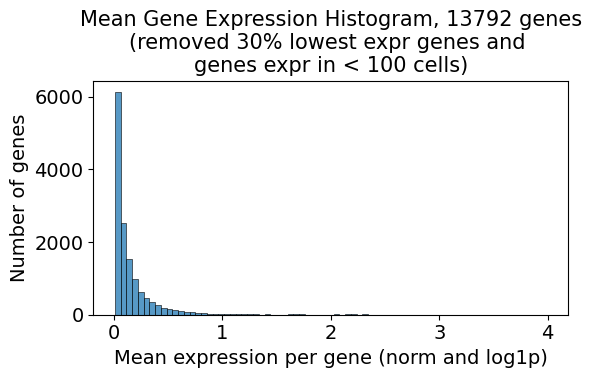

In [139]:
histogram_lowest_expression_genes(
    adata_norm_30pct_90cells_seurat_pval, 
    title="Mean Gene Expression Histogram, 13792 genes\n(removed 30% lowest expr genes and \ngenes expr in < 100 cells)"
    )

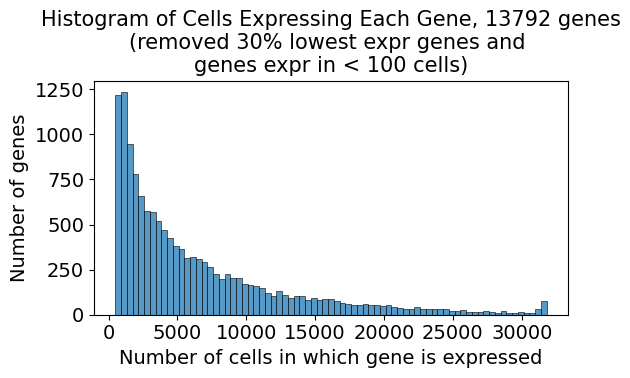

In [140]:
histogram_cells_expressing_gene(
    adata_norm_30pct_100cells_seurat_pval, 
    title="Histogram of Cells Expressing Each Gene, 13792 genes\n(removed 30% lowest expr genes and \ngenes expr in < 100 cells)"
    )

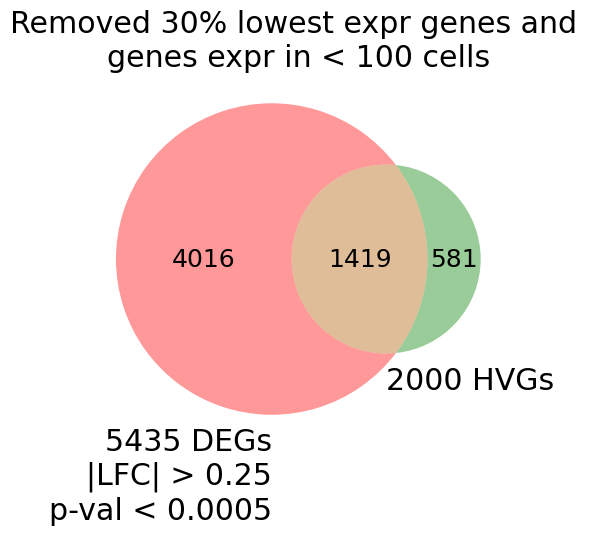

In [156]:
title = 'Removed 30% lowest expr genes and \ngenes expr in < 100 cells'
label1 = '5435 DEGs\n|LFC| > 0.25\np-val < 0.0005'
label2 = '2000 HVGs'
plot_venn(res_norm_30pct_100cells_seurat_pval[0], 
          res_norm_30pct_100cells_seurat_pval[1], 
          label1, label2, title)

In [158]:
adata_norm_30pct_100cells_seurat_pval.write_h5ad("/home/ranwyl/data_tf_project/tf_kos_by_filtered_genes.h5ad")

In [18]:
filt_genes = pd.DataFrame(adata_norm_30pct_100cells_seurat_pval.var.index)
filt_genes.head()

,0
0,ENSG00000241860
1,ENSG00000290385
2,ENSG00000291215
3,LINC01409
4,LINC01128


In [19]:
filt_genes.to_pickle("/home/ranwyl/data_tf_project/genes_filt_30pct_100cells.pkl")

### DEGs based on p-adj

In [85]:
# res_counts_10pct_1cell_seurat_padj = \
#     get_degs_hvgs(adata_tfs, filt_layer="counts", percent_thr=10, n_cells_thr=None, 
#                   hvg_method="seurat_v3", padj_or_pval="padj",
#                   degs_padj_set=degs_padj, degs_pval_set=degs_pval)

In [86]:
# res_counts_20pct_1cell_seurat_padj = \
#     get_degs_hvgs(adata_tfs, filt_layer="counts", percent_thr=20, n_cells_thr=None, 
#                   hvg_method="seurat_v3", padj_or_pval="padj",
#                   degs_padj_set=degs_padj, degs_pval_set=degs_pval)

In [87]:
# res_counts_10cells_seurat_padj = \
#     get_degs_hvgs(adata_tfs, filt_layer="counts", percent_thr=None, n_cells_thr=10, 
#                   hvg_method="seurat_v3", padj_or_pval="padj",
#                   degs_padj_set=degs_padj, degs_pval_set=degs_pval)

In [88]:
# res_counts_30cells_seurat_padj = \
#     get_degs_hvgs(adata_tfs, filt_layer="counts", percent_thr=None, n_cells_thr=30, 
#                   hvg_method="seurat_v3", padj_or_pval="padj",
#                   degs_padj_set=degs_padj, degs_pval_set=degs_pval)

In [89]:
# res_counts_50cells_seurat_padj = \
#     get_degs_hvgs(adata_tfs, filt_layer="counts", percent_thr=None, n_cells_thr=50, 
#                   hvg_method="seurat_v3", padj_or_pval="padj",
#                   degs_padj_set=degs_padj, degs_pval_set=degs_pval)

In [90]:
# res_counts_10pct_10cells_seurat_padj = \
#     get_degs_hvgs(adata_tfs, filt_layer="counts", percent_thr=10, n_cells_thr=10, 
#                   hvg_method="seurat_v3", padj_or_pval="padj",
#                   degs_padj_set=degs_padj, degs_pval_set=degs_pval)

In [91]:
# res_counts_20pct_10cells_seurat_padj = \
#     get_degs_hvgs(adata_tfs, filt_layer="counts", percent_thr=20, n_cells_thr=10, 
#                   hvg_method="seurat_v3", padj_or_pval="padj",
#                   degs_padj_set=degs_padj, degs_pval_set=degs_pval)

In [2]:
# title = 'Removed 20% lowest expr genes and \ngenes expr in < 10 cells (15615 genes)\nDEGs chosen with p-adj cutoff'
# label1 = '5079 DEGs\n|LFC| > 0.25\np-adj < 0.05'
# label2 = '2000 HVGs'
# plot_venn(res_counts_20pct_10cells_seurat_padj[0], 
#           res_counts_20pct_10cells_seurat_padj[1], 
#           label1, label2, title)

In [92]:
# res_counts_20pct_30cells_seurat_padj = \
#     get_degs_hvgs(adata_tfs, filt_layer="counts", percent_thr=20, n_cells_thr=30, 
#                   hvg_method="seurat_v3", padj_or_pval="padj",
#                   degs_padj_set=degs_padj, degs_pval_set=degs_pval)

In [93]:
# res_cellranger_padj = \
#     get_degs_hvgs(adata_tfs, filt_layer=None, 
#                 percent_thr=None, n_cells_thr=None, 
#                 hvg_method="cell_ranger", padj_or_pval="padj",
#                 degs_padj_set=degs_padj, degs_pval_set=degs_pval)

In [10]:
res_norm_30pct_100cells_seurat_padj = \
    get_degs_hvgs(adata_tfs, filt_layer="pre_z_normalization", percent_thr=30, n_cells_thr=100, 
                  hvg_method="seurat_v3", padj_or_pval="padj",
                  degs_padj_set=degs_padj, degs_pval_set=degs_pval)

Removed 23775 genes
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
4831 DEGs, 2000 HVGs, 1373 shared genes


In [12]:
_, hvgs_30_100, adata_norm_30pct_100cells_seurat_padj = res_norm_30pct_100cells_seurat_padj
adata_norm_30pct_100cells_seurat_padj.shape

(31808, 13792)

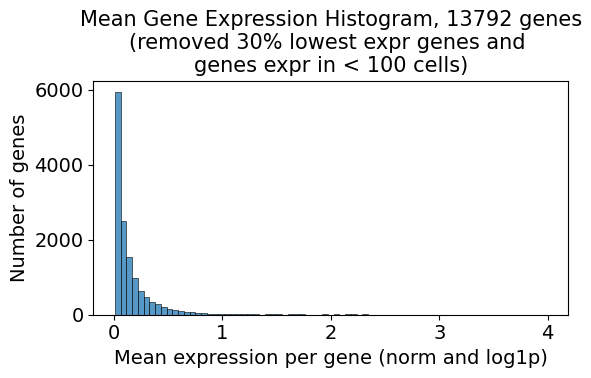

In [13]:
histogram_lowest_expression_genes(
    adata_norm_30pct_100cells_seurat_padj, 
    title="Mean Gene Expression Histogram, 13792 genes\n(removed 30% lowest expr genes and \ngenes expr in < 100 cells)"
    )

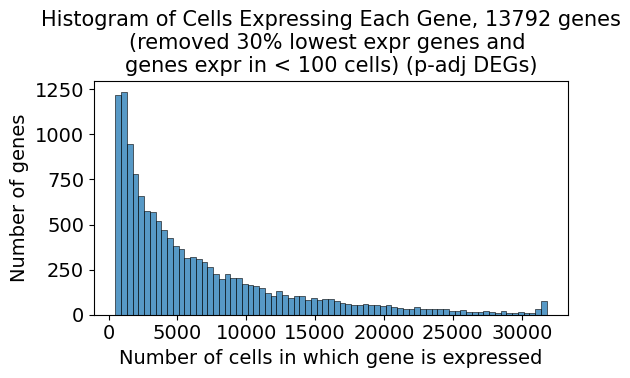

In [14]:
histogram_cells_expressing_gene(
    adata_norm_30pct_100cells_seurat_padj, 
    title="Histogram of Cells Expressing Each Gene, 13792 genes\n(removed 30% lowest expr genes and \ngenes expr in < 100 cells) (p-adj DEGs)")

In [11]:
res_norm_40pct_100cells_seurat_padj = \
    get_degs_hvgs(adata_tfs, filt_layer="pre_z_normalization", percent_thr=40, n_cells_thr=100, 
                  hvg_method="seurat_v3", padj_or_pval="padj",
                  degs_padj_set=degs_padj, degs_pval_set=degs_pval)

Removed 25745 genes
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
4686 DEGs, 2000 HVGs, 1395 shared genes


In [19]:
res_norm_40pct_100cells_seurat_padj[2]

AnnData object with n_obs × n_vars = 31808 × 11822
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

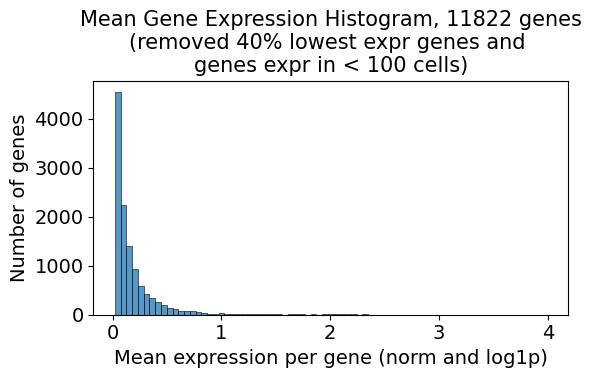

In [22]:
histogram_lowest_expression_genes(
    res_norm_40pct_100cells_seurat_padj[2], 
    title="Mean Gene Expression Histogram, 11822 genes\n(removed 40% lowest expr genes and \ngenes expr in < 100 cells)"
    )

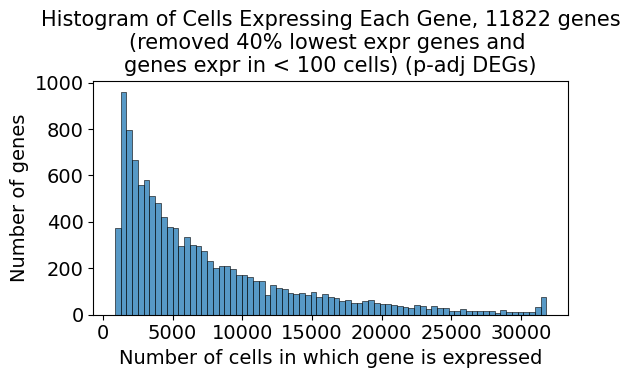

In [21]:
histogram_cells_expressing_gene(
    res_norm_40pct_100cells_seurat_padj[2], 
    title="Histogram of Cells Expressing Each Gene, 11822 genes\n(removed 40% lowest expr genes and \ngenes expr in < 100 cells) (p-adj DEGs)")

### Testing a bunch of feature selection variables

In [ ]:
with open("/home/ranwyl/results_tf_project/degs_padj_final.txt") as f:
    degs_padj = {deg.strip() for deg in f.readlines()}
print(len(degs_padj))

5096


In [ ]:
with open("/home/ranwyl/results_tf_project/degs_pval_final.txt") as f:
    degs_pval = {deg.strip() for deg in f.readlines()}
print(len(degs_pval))

5565


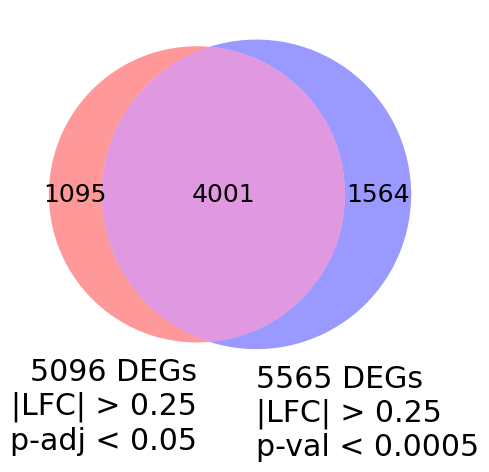

In [ ]:
n_degs_padj, n_degs_pval = len(degs_padj), len(degs_pval)
n_shared_genes = len(degs_padj.intersection(degs_pval))
left = n_degs_padj - n_shared_genes
right = n_degs_pval - n_shared_genes
venn2(subsets = (left, right, n_shared_genes), 
      set_labels = ('5096 DEGs\n|LFC| > 0.25\np-adj < 0.05',
                    '5565 DEGs\n|LFC| > 0.25\np-val < 0.0005'),
      set_colors = ("red", "blue"), 
      alpha=0.4)
plt.show()

In [ ]:
with open("/home/ranwyl/results_tf_project/hvgs_tfs_no_gene_filter.txt") as f:
    hvgs_tf_kos  = {hvg.strip() for hvg in f.readlines()}
print(len(hvgs_tf_kos))

2000


In [ ]:
with open("/home/ranwyl/results_tf_project/hvgs_tf_ntc_no_gene_filter.txt") as f:
    hvgs_tf_ko_ntc  = {hvg.strip() for hvg in f.readlines()}
print(len(hvgs_tf_ko_ntc))

2000


In [ ]:
plt.rcParams['font.size'] = 18
def plot_venn(gene_set1, gene_set2, label1, label2, color1="red", color2="green"):
    n_genes1, n_genes2 = len(gene_set1), len(gene_set2)
    n_shared_genes = len([g for g in gene_set2 if g in gene_set1])
    left = n_genes1 - n_shared_genes
    right = n_genes2 - n_shared_genes
    venn2(subsets = (left, right, n_shared_genes), 
        set_labels = (label1, label2),
        set_colors = (color1, color2),
        alpha=0.4)
    plt.show()

# Example label: '5087 DEGs\n|LFC| > 0.25\npadj < 0.05'

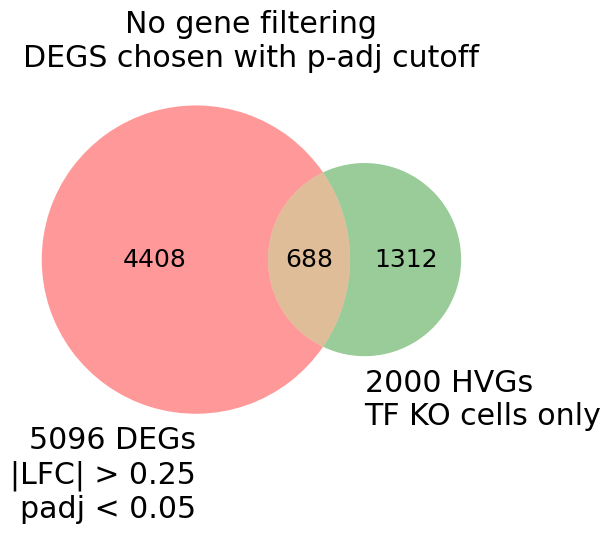

In [ ]:
label1 = '5096 DEGs\n|LFC| > 0.25\npadj < 0.05'
label2 = '2000 HVGs\nTF KO cells only'
title = "No gene filtering\nDEGS chosen with p-adj cutoff"
plot_venn(degs_padj, hvgs_tf_kos, label1, label2, title)

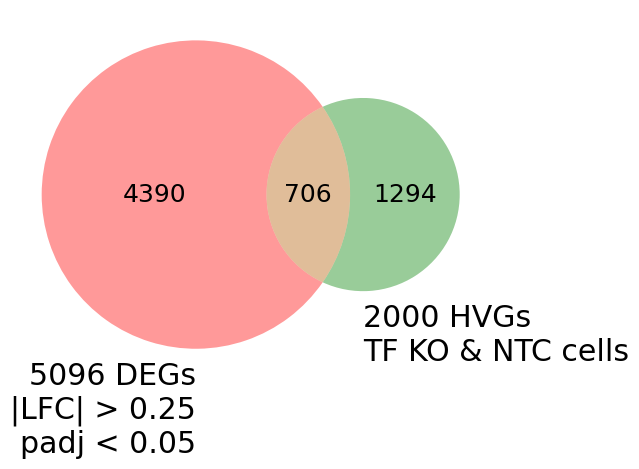

In [ ]:
label1 = '5096 DEGs\n|LFC| > 0.25\npadj < 0.05'
label2 = '2000 HVGs\nTF KO & NTC cells'
plot_venn(degs_padj, hvgs_tf_ko_ntc, label1, label2)

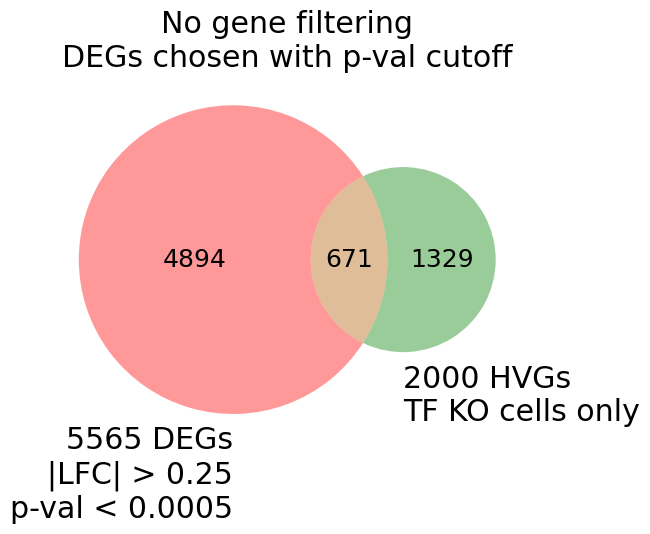

In [ ]:
label1 = '5565 DEGs\n|LFC| > 0.25\np-val < 0.0005'
label2 = '2000 HVGs\nTF KO cells only'
plot_venn(degs_pval, hvgs_tf_kos, label1, label2, 
          title="No gene filtering\nDEGs chosen with p-val cutoff")

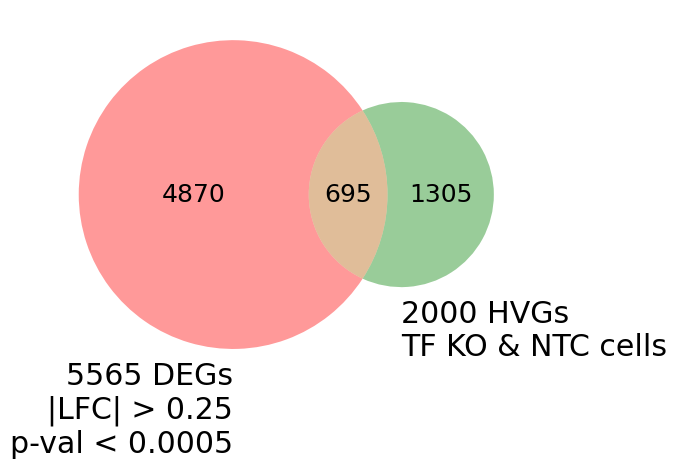

In [ ]:
label1 = '5565 DEGs\n|LFC| > 0.25\np-val < 0.0005'
label2 = '2000 HVGs\nTF KO & NTC cells'
plot_venn(degs_pval, hvgs_tf_ko_ntc, label1, label2)

### Testing feature selection - HVGs without filtering genes not present in at least 25 cells

In [ ]:
plt.rcParams['font.size'] = 18

In [ ]:
# Read in batch-corrected TF KO and NTC dataset
adata_tf_ntc = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_TF_KO_NTC_Batch_Normalized.h5ad")
# List of 1639 TFs from Lambert et al (2018)
lambert_csv = pd.read_csv("Lambert_2018_TFs.csv")
tfs = lambert_csv[lambert_csv.iloc[:,3] == "Yes"].iloc[:,1].tolist()
tfs = set(tfs)
# Filter TFs
print(f"number of cells before filtering: {adata_tf_ntc.obs.shape[0]}")
adata_tfs = adata_tf_ntc[adata_tf_ntc.obs["gene_target"].isin(tfs)].copy()
print(f"number of cells after filtering: {adata_tfs.obs.shape[0]}")

number of cells before filtering: 69241
number of cells after filtering: 31808


In [ ]:
adata_tfs_hvgs = adata_tfs.copy()
sc.pp.highly_variable_genes(adata_tfs_hvgs, n_top_genes=2000, subset=True, flavor='seurat_v3', layer='counts')

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


In [ ]:
hvgs_tfs_no_gene_filter_list = adata_tfs_hvgs.var.index.tolist()
hvgs_tfs_no_gene_filter_list.sort()
hvgs_tfs_no_gene_filter = set(hvgs_tfs_no_gene_filter_list)

In [ ]:
with open("/home/ranwyl/results_tf_project/hvgs_tfs_no_gene_filter.txt", "w") as f:
    for hvg in hvgs_tfs_no_gene_filter_list:
        f.write(f"{hvg}\n")

In [ ]:
adata_tf_ntc_hvgs = adata_tf_ntc.copy()
sc.pp.highly_variable_genes(adata_tf_ntc_hvgs, n_top_genes=2000, subset=True, flavor='seurat_v3', layer='counts')

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


In [ ]:
hvgs_tf_ntc_no_gene_filter_list = adata_tf_ntc_hvgs.var.index.tolist()
hvgs_tf_ntc_no_gene_filter_list.sort()
hvgs_tf_ntc_no_gene_filter = set(hvgs_tf_ntc_no_gene_filter_list)

In [ ]:
with open("/home/ranwyl/results_tf_project/hvgs_tf_ntc_no_gene_filter.txt", "w") as f:
    for hvg in hvgs_tf_ntc_no_gene_filter_list:
        f.write(f"{hvg}\n")

In [ ]:
adata_hvgs_old = ad.read_h5ad("/home/ranwyl/data_tf_project/tf_kos_by_2000_hvgs.h5ad")
hvgs_old = adata_hvgs_old.var.index.tolist()
hvgs_old = set(hvgs_old)

In [ ]:
print(len(hvgs_tfs_no_gene_filter - hvgs_old))

571


In [ ]:
with open("/home/ranwyl/results_tf_project/hvgs_2000_old.txt", "w") as f:
    for hvg in hvgs_old:
        f.write(f"{hvg}\n")

### Testing feature selection - filter TF KOs with fewer than 50 cells

In [ ]:
adata_tfs = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_TF_KO_Batch_Normalized.h5ad")

In [ ]:
cells_per_tf_ko = pd.DataFrame(adata_tfs.obs['gene_target'].value_counts())
cells_per_tf_ko.head()

,count
gene_target,
ZFP41,209
ARHGAP35,186
DNMT1,150
ZNF354A,139
BHLHE40,139


In [ ]:
def tf_kos_with_min_cells(cells_per_tf_ko_df, n_min_cells):
    tf_ko_list = cells_per_tf_ko_df[cells_per_tf_ko_df["count"] > n_min_cells].index.tolist()
    return tf_ko_list

In [ ]:
tf_kos_min_50_cells = tf_kos_with_min_cells(cells_per_tf_ko, 50)
print(tf_kos_min_50_cells[:5])
print(len(tf_kos_min_50_cells))

['ZFP41', 'ARHGAP35', 'DNMT1', 'ZNF354A', 'BHLHE40']
234


Compare to "strong perturbations"

In [ ]:
# DE results
de_results = pd.read_pickle("/home/ranwyl/results_tf_project/TF_KO_NTC_DE_results_shrunk_adaptFalse.pkl")
de_results.head()

,DMRT2_baseMean,DMRT2_log2FoldChange,DMRT2_lfcSE,DMRT2_stat,DMRT2_pvalue,DMRT2_padj,OSR2_baseMean,OSR2_log2FoldChange,OSR2_lfcSE,OSR2_stat,...,ZBED6_lfcSE,ZBED6_stat,ZBED6_pvalue,ZBED6_padj,FAM200B_baseMean,FAM200B_log2FoldChange,FAM200B_lfcSE,FAM200B_stat,FAM200B_pvalue,FAM200B_padj
A1BG,5.197361,0.603388,0.610262,1.249251,0.211573,NaN,3.271476,-0.219247,0.719732,-0.436204,...,0.928560,-1.333630,0.182325,0.93709,3.431164,-0.557770,0.756780,-1.045982,0.295569,0.943485
A1BG-AS1,2.117718,0.544581,0.911720,0.986719,0.323780,NaN,0.659727,-0.021330,1.140542,-0.048274,...,1.246887,-0.863337,0.387952,0.93709,0.627773,-0.762906,1.404104,-1.112549,0.265902,0.943485
A1CF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
A2M,0.349860,-0.390388,1.225741,-0.692164,0.488835,NaN,0.826464,-0.187075,1.073352,-0.401825,...,1.930966,1.844563,0.065101,0.93709,0.643332,0.025018,1.154267,0.060363,0.951867,0.979964
A2M-AS1,0.311871,0.340470,1.828676,0.582373,0.560315,NaN,0.976668,0.678086,1.342768,1.186024,...,1.135588,-0.197266,0.843620,0.93709,0.823219,0.181208,1.157592,0.401337,0.688172,0.943485


In [ ]:
def determine_strong_perturbations(de_df, padj_threshold):
    # Get list of perturbations from column labels
    perts = {col.split("_")[0] for col in de_df.columns}
    # Get TF KOs with >= 10 DEGs (based on padj)
    strong_pert_list = list()
    for pert in perts:
        n_degs = de_df.loc[de_df[f"{pert}_padj"] < padj_threshold].shape[0]
        if n_degs >= 10:
            strong_pert_list.append(pert)
    return list(sorted(strong_pert_list))

In [ ]:
strong_perts = determine_strong_perturbations(de_results, 0.05)
print(len(strong_perts))
print(strong_perts[:5])

402
['ADNP2', 'AIRE', 'ANKZF1', 'ARHGAP35', 'ARID3B']


In [ ]:
strong_perts = set(strong_perts)
tf_kos_min_50_cells = set(tf_kos_min_50_cells)
print(len(strong_perts.intersection(tf_kos_min_50_cells)))

169


Filter dataset and find DEGS + HVGs

In [ ]:
adata_tfs

AnnData object with n_obs × n_vars = 31808 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

In [ ]:
adata_tfs_filt = adata_tfs[adata_tfs.obs["gene_target"].isin(tf_kos_min_50_cells)].copy()
adata_tfs_filt

AnnData object with n_obs × n_vars = 16728 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

In [ ]:
def filter_degs_lfc_pval(de_df, lfc_threshold=0.25, pval_threshold=0.05, tf_ko_list=None):
    if not tf_ko_list:
        # Get list of perturbations from column labels
        perts = {col.split("_")[0] for col in de_df.columns}
    else:
        perts = tf_ko_list
    # Get genes where |L2FC| > threshold and p-adj < threshold
    deg_set = set()
    for pert in perts:
        l2fc_col = f"{pert}_log2FoldChange"
        pval_col = f"{pert}_pvalue"
        deg_set.update(de_df.loc[(abs(de_df[l2fc_col]) > lfc_threshold) 
                                   & (de_df[pval_col] < pval_threshold)].index)
    return deg_set

In [ ]:
# DEGs
filt_degs = filter_degs_lfc_pval(de_results, pval_threshold=0.001, tf_ko_list=tf_kos_min_50_cells)
print(len(filt_degs))

5646


In [ ]:
# HVGs
adata_tfs_filt_hvgs = adata_tfs_filt.copy()
sc.pp.highly_variable_genes(adata_tfs_filt_hvgs, n_top_genes=2000, subset=True, flavor='seurat_v3', layer='counts')
filt_hvgs_list = adata_tfs_filt_hvgs.var.index.tolist()
filt_hvgs = set(filt_hvgs_list)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


In [ ]:
print(len(filt_degs.intersection(filt_hvgs)))

738


### Testing feature selection - HVGs, batch ALPHA cells

In [ ]:
plt.rcParams['font.size'] = 18

In [ ]:
# Read in batch-corrected TF KO and NTC dataset
adata_tf_ntc = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_TF_KO_NTC_Batch_Normalized.h5ad")

In [ ]:
# List of 1639 TFs from Lambert et al (2018)
lambert_csv = pd.read_csv("Lambert_2018_TFs.csv")
tfs = lambert_csv[lambert_csv.iloc[:,3] == "Yes"].iloc[:,1].tolist()
tfs = set(tfs)

Get HVGs for batch ALPHA TF KO and NTC cells using seurat_v3 method

In [ ]:
adata_tf_ntc_alpha = adata_tf_ntc[adata_tf_ntc.obs["run"] == "ALPHA"].copy()

In [ ]:
sc.pp.highly_variable_genes(adata_tf_ntc_alpha, n_top_genes=2000, subset=True, flavor='seurat_v3', layer='counts')

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


In [ ]:
hvgs_tf_ntc_alpha_list = adata_tf_ntc_alpha.var.index.tolist()
hvgs_tf_ntc_alpha = set(hvgs_tf_ntc_alpha_list)

Get HVGs for batch ALPHA TF KO cells using seurat_v3 method

In [ ]:
# Batch-corrected dataset with only TF KOs
adata_tfs = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_TF_KO_Batch_Normalized.h5ad")

In [ ]:
adata_tfs_alpha = adata_tfs[adata_tfs.obs["run"] == "ALPHA"].copy()
sc.pp.highly_variable_genes(adata_tfs_alpha, n_top_genes=2000, subset=True, flavor='seurat_v3', layer='counts')

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


In [ ]:
hvgs_tfs_alpha_list = adata_tfs_alpha.var.index.tolist()
hvgs_tfs_alpha = set(hvgs_tfs_alpha_list)

Get DEGs from batch ALPHA only

In [ ]:
alpha_tfs = adata_tfs[adata_tfs.obs["run"] == "ALPHA"].obs["gene_target"].unique().tolist()
beta_tfs = adata_tfs[adata_tfs.obs["run"] == "BETA"].obs["gene_target"].unique().tolist()
gamma_tfs = adata_tfs[adata_tfs.obs["run"] == "GAMMA"].obs["gene_target"].unique().tolist()
print(f"Number of TF KOs per batch: ALPHA {len(alpha_tfs)}, BETA {len(beta_tfs)}, GAMMA {len(gamma_tfs)}")

Number of TF KOs per batch: ALPHA 643, BETA 8, GAMMA 1


In [ ]:
print(", ".join(beta_tfs))
print(gamma_tfs)

AKAP8L, MSANTD4, PIN1, RBCK1, SNAPC5, CCDC17, MTERF4, ZBED6
['FAM200B']


In [ ]:
def get_alpha_degs_padj(deg_df, alpha_tf_list, lfc_threshold=0.25, padj_threshold=0.05):
    deg_set = set()
    for pert in alpha_tf_list:
        l2fc_col = f"{pert}_log2FoldChange"
        padj_col = f"{pert}_padj"
        deg_set.update(deg_df.loc[(abs(deg_df[l2fc_col]) > lfc_threshold) 
                        & (deg_df[padj_col] < padj_threshold)].index)
    return deg_set

In [ ]:
# DE results
de_results = pd.read_pickle("/home/ranwyl/results_tf_project/TF_KO_NTC_DE_results_shrunk_adaptFalse.pkl")

In [ ]:
degs_alpha = get_alpha_degs_padj(de_results, alpha_tfs)
print(len(degs_alpha))

5077


Compare batch ALPHA padj DEGs to 2000 batch ALPHA (TF KO and NTC) HVGs

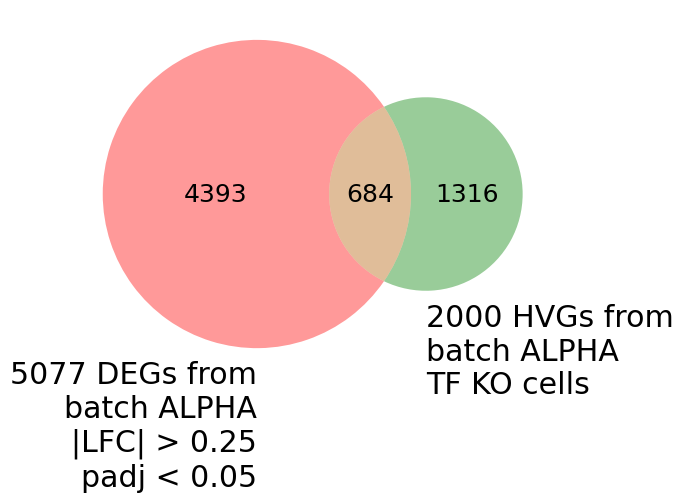

In [ ]:
label1 = '5077 DEGs from\nbatch ALPHA\n|LFC| > 0.25\npadj < 0.05'
label2 = '2000 HVGs from\nbatch ALPHA\nTF KO cells'
plot_venn(degs_alpha, hvgs_tfs_alpha, label1, label2)

Compare batch ALPHA DEGs to 2000 batch ALPHA (TF KO only) HVGs

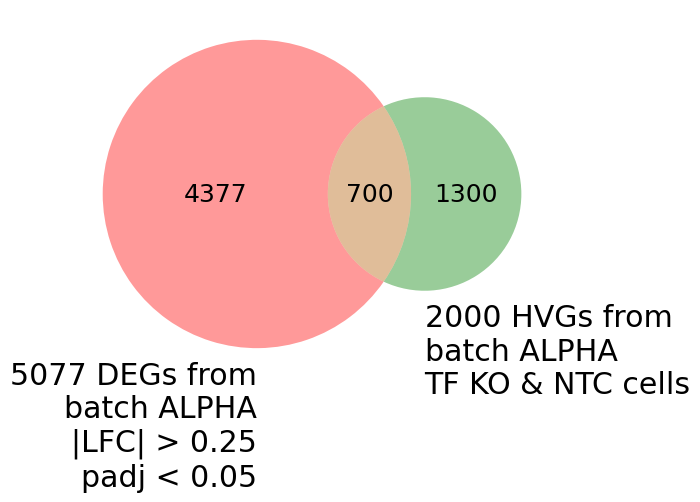

In [ ]:
label1 = '5077 DEGs from\nbatch ALPHA\n|LFC| > 0.25\npadj < 0.05'
label2 = '2000 HVGs from\nbatch ALPHA\nTF KO & NTC cells'
plot_venn(degs_alpha, hvgs_tf_ntc_alpha, label1, label2)

### (OLD) Testing feature selection - HVGs, batch ALPHA cells

In [8]:
from matplotlib_venn import venn2
plt.rcParams['font.size'] = 18

In [9]:
# Read in batch-corrected TF KO and NTC dataset
adata_tf_ntc = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_TF_KO_NTC_Batch_Normalized.h5ad")
# Reset X to raw counts
adata_tf_ntc.X = adata_tf_ntc.layers["counts"].copy()
# Remove genes that are present in fewer than 25 cells
sc.pp.filter_genes(adata_tf_ntc, min_cells=25)

# Get list of DEGs from full dataset
adata_degs = ad.read_h5ad("/home/ranwyl/data_tf_project/tf_kos_by_5087_degs.h5ad")
degs = adata_degs.var.index.tolist()

filtered out 11040 genes that are detected in less than 25 cells


In [4]:
# List of 1639 TFs from Lambert et al (2018)
lambert_csv = pd.read_csv("Lambert_2018_TFs.csv")
tfs = lambert_csv[lambert_csv.iloc[:,3] == "Yes"].iloc[:,1].tolist()
tfs = set(tfs)

Get HVGs for batch ALPHA TF KO and NTC cells using seurat_v3 method

In [10]:
adata_tf_ntc_alpha = adata_tf_ntc[adata_tf_ntc.obs["run"] == "ALPHA"].copy()

In [11]:
sc.pp.highly_variable_genes(adata_tf_ntc_alpha, n_top_genes=2000, subset=True, flavor='seurat_v3', layer='counts')

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


In [12]:
hvgs_tf_ntc_alpha = adata_tf_ntc_alpha.var.index.tolist()

In [13]:
n_degs = len(degs)
n_hvgs = len(hvgs_tf_ntc_alpha)
n_shared_genes = len([g for g in hvgs_tf_ntc_alpha if g in degs])
print(f"Number of DEGs: {n_degs}")
print(f"Number of HVGs in ALPHA TF KO/NTC dataset: {n_hvgs}")
print(f"HVGs from ALPHA 2000-HVG set in 5087-DEG set: {n_shared_genes}")

Number of DEGs: 5087
Number of HVGs in ALPHA TF KO/NTC dataset: 2000
HVGs from ALPHA 2000-HVG set in 5087-DEG set: 889


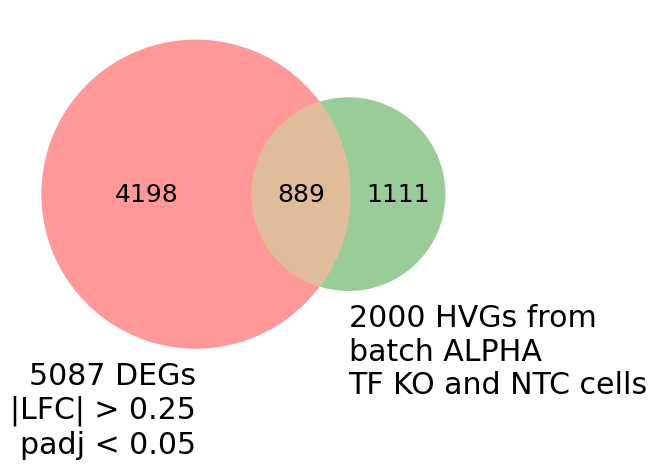

In [14]:
left = n_degs - n_shared_genes
right = n_hvgs - n_shared_genes
venn2(subsets = (left, right, n_shared_genes), 
      set_labels = ('5087 DEGs\n|LFC| > 0.25\npadj < 0.05', '2000 HVGs from \nbatch ALPHA\nTF KO and NTC cells'))
plt.show()

Get HVGs for batch ALPHA TF KO cells using seurat_v3 method

In [15]:
# Batch-corrected dataset with only TF KOs and with only genes present in >= 25 cells
adata_tfs = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_TF_KO_Batch_Normalized.h5ad")
# Reset X to raw counts
adata_tfs.X = adata_tfs.layers["counts"].copy()

In [16]:
adata_tfs_alpha = adata_tfs[adata_tfs.obs["run"] == "ALPHA"].copy()
sc.pp.highly_variable_genes(adata_tfs_alpha, n_top_genes=2000, subset=True, flavor='seurat_v3', layer='counts')
hvgs_alpha_tf = adata_tfs_alpha.var.index.tolist()

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


In [17]:
n_degs = len(degs)
n_hvgs = len(hvgs_alpha_tf)
n_shared_genes = len([g for g in hvgs_alpha_tf if g in degs])
print(f"Number of DEGs: {n_degs}")
print(f"Number of HVGs in ALPHA TF KO dataset: {n_hvgs}")
print(f"HVGs from ALPHA TF KO 2000-HVG set in 5087-DEG set: {n_shared_genes}")

Number of DEGs: 5087
Number of HVGs in ALPHA TF KO dataset: 2000
HVGs from ALPHA TF KO 2000-HVG set in 5087-DEG set: 937


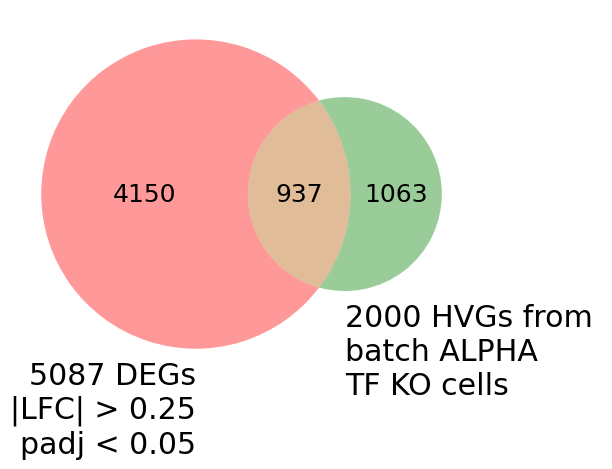

In [18]:
left = n_degs - n_shared_genes
right = n_hvgs - n_shared_genes
venn2(subsets = (left, right, n_shared_genes), 
      set_labels = ('5087 DEGs\n|LFC| > 0.25\npadj < 0.05', '2000 HVGs from \nbatch ALPHA\nTF KO cells'))
plt.show()

Get DEGs from batch ALPHA only

In [19]:
alpha_tfs = adata_tfs[adata_tfs.obs["run"] == "ALPHA"].obs["gene_target"].unique().tolist()
beta_tfs = adata_tfs[adata_tfs.obs["run"] == "BETA"].obs["gene_target"].unique().tolist()
gamma_tfs = adata_tfs[adata_tfs.obs["run"] == "GAMMA"].obs["gene_target"].unique().tolist()
print(f"Number of TF KOs per batch: ALPHA {len(alpha_tfs)}, BETA {len(beta_tfs)}, GAMMA {len(gamma_tfs)}")

Number of TF KOs per batch: ALPHA 643, BETA 8, GAMMA 1


In [22]:
print(", ".join(beta_tfs))
print(gamma_tfs)

AKAP8L, MSANTD4, PIN1, RBCK1, SNAPC5, CCDC17, MTERF4, ZBED6
['FAM200B']


In [18]:
def get_alpha_degs_padj(deg_df, alpha_tf_list, lfc_threshold=0.25, padj_threshold=0.05):
    deg_set = set()
    for pert in alpha_tf_list:
        l2fc_col = f"{pert}_log2FoldChange"
        padj_col = f"{pert}_padj"
        deg_set.update(deg_df.loc[(abs(deg_df[l2fc_col]) > lfc_threshold) 
                        & (deg_df[padj_col] < padj_threshold)].index)
    return deg_set

In [2]:
# DE results
de_results = pd.read_pickle("/home/ranwyl/results_tf_project/TF_KO_NTC_DE_results.pkl")

In [ ]:
alpha_degs = get_alpha_degs_padj(de_results, alpha_tfs)
print(len(alpha_degs))

5076


Compare 5076 batch ALPHA DEGs to 2000 batch ALPHA (TF KO and NTC) HVGs

In [23]:
n_degs = len(alpha_degs)
n_hvgs = len(hvgs_tf_ntc_alpha)
n_shared_genes = len([g for g in hvgs_tf_ntc_alpha if g in alpha_degs])
print(f"Number of ALPHA DEGs: {n_degs}")
print(f"Number of HVGs in ALPHA TF KO and NTC dataset: {n_hvgs}")
print(f"HVGs from ALPHA TF KO and NTC 2000-HVG set in 5087-DEG set: {n_shared_genes}")

Number of ALPHA DEGs: 5076
Number of HVGs in ALPHA TF KO and NTC dataset: 2000
HVGs from ALPHA TF KO and NTC 2000-HVG set in 5087-DEG set: 888


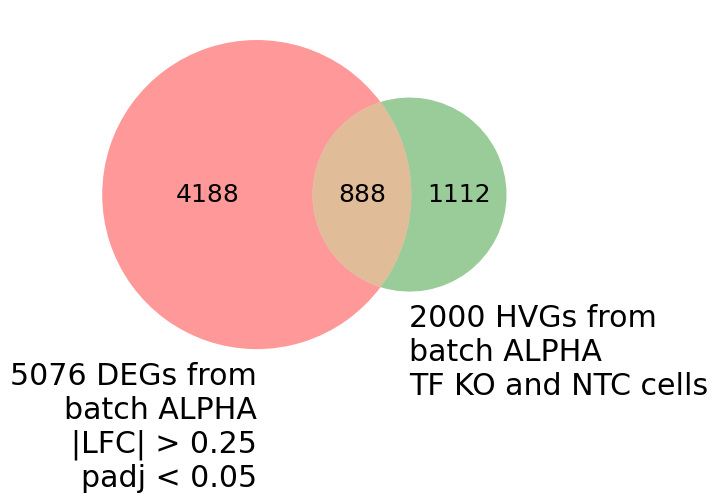

In [24]:
left = n_degs - n_shared_genes
right = n_hvgs - n_shared_genes
venn2(subsets = (left, right, n_shared_genes), 
      set_labels = ('5076 DEGs from\nbatch ALPHA\n|LFC| > 0.25\npadj < 0.05', 
                    '2000 HVGs from\nbatch ALPHA\nTF KO and NTC cells'))
plt.show()

Compare 5076 batch ALPHA DEGs to 2000 batch ALPHA (TF KO only) HVGs

In [25]:
n_degs = len(alpha_degs)
n_hvgs = len(hvgs_alpha_tf)
n_shared_genes = len([g for g in hvgs_alpha_tf if g in alpha_degs])
print(f"Number of ALPHA DEGs: {n_degs}")
print(f"Number of HVGs in ALPHA TF KO dataset: {n_hvgs}")
print(f"HVGs from ALPHA TF KO 2000-HVG set in 5087-DEG set: {n_shared_genes}")

Number of ALPHA DEGs: 5076
Number of HVGs in ALPHA TF KO dataset: 2000
HVGs from ALPHA TF KO 2000-HVG set in 5087-DEG set: 936


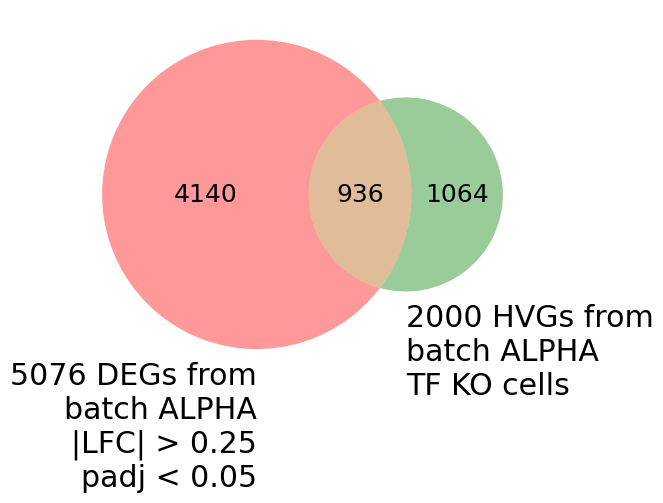

In [26]:
left = n_degs - n_shared_genes
right = n_hvgs - n_shared_genes
venn2(subsets = (left, right, n_shared_genes), 
      set_labels = ('5076 DEGs from\nbatch ALPHA\n|LFC| > 0.25\npadj < 0.05', 
                    '2000 HVGs from\nbatch ALPHA\nTF KO cells'))
plt.show()

Compare HVGs from full dataset, HVGs from batch ALPHA TF KO cells only, and HVGs from batch ALPHA TF KO and NTC cells. 

In [27]:
adata_hvgs = ad.read_h5ad("/home/ranwyl/data_tf_project/tf_kos_by_2000_hvgs.h5ad")
hvgs_full = adata_hvgs.var.index.tolist()
hvgs_full = set(hvgs_full)

In [29]:
hvgs_alpha_tf = set(hvgs_alpha_tf)
hvgs_alpha_tf_ntc = set(hvgs_tf_ntc_alpha)

In [33]:
print(f"HVGs in TF KO dataset not in batch ALPHA TF KO dataset: {len(hvgs_full - hvgs_alpha_tf)}")
print(f"HVGs in TF KO dataset not in batch ALPHA TF KO and NTC dataset: {len(hvgs_full - hvgs_alpha_tf_ntc)}")
print(f"HVGs in batch ALPHA TF KO and NTC dataset not in batch ALPHA TF KO dataset: {len(hvgs_alpha_tf_ntc - hvgs_alpha_tf)}")

HVGs in TF KO dataset not in batch ALPHA TF KO dataset: 29
HVGs in TF KO dataset not in batch ALPHA TF KO and NTC dataset: 187
HVGs in batch ALPHA TF KO and NTC dataset not in batch ALPHA TF KO dataset: 186


Examine genes that are HVGs only

In [35]:
alpha_hvgs_only = set(hvgs_alpha) - set(alpha_degs)
print(len(alpha_hvgs_only))
alpha_hvgs_only = sorted(list(alpha_hvgs_only))
print(alpha_hvgs_only[40:50])
print(alpha_hvgs_only[650:660])

1112
['ASPA', 'ATP11AUN', 'ATP6V0D2', 'AURKA', 'AXDND1', 'B4GALNT2', 'B4GALT4-AS1', 'BBOF1', 'BBOX1-AS1', 'BCL2']
['IFIT2', 'IGFL2-AS1', 'IGFL3', 'IL10RA', 'IL12A-AS1', 'IL19', 'IL1RAPL2', 'IL23R', 'IL2RA', 'IL33']


BCL2 blocks apoptosis and IL19 is an anti-inflammatory and proangiogenic cytokine. Examine the DE results for these genes.

In [6]:
de_results.head()

,DMRT2_baseMean,DMRT2_log2FoldChange,DMRT2_lfcSE,DMRT2_stat,DMRT2_pvalue,DMRT2_padj,OSR2_baseMean,OSR2_log2FoldChange,OSR2_lfcSE,OSR2_stat,...,ZBED6_lfcSE,ZBED6_stat,ZBED6_pvalue,ZBED6_padj,FAM200B_baseMean,FAM200B_log2FoldChange,FAM200B_lfcSE,FAM200B_stat,FAM200B_pvalue,FAM200B_padj
A1BG,5.197361,0.603388,0.610262,1.249251,0.211573,NaN,3.271476,-0.219247,0.719732,-0.436204,...,0.928560,-1.333630,0.182325,0.93709,3.431164,-0.557770,0.756780,-1.045982,0.295569,0.943485
A1BG-AS1,2.117718,0.544581,0.911720,0.986719,0.323780,NaN,0.659727,-0.021330,1.140542,-0.048274,...,1.246887,-0.863337,0.387952,0.93709,0.627773,-0.762906,1.404104,-1.112549,0.265902,0.943485
A1CF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
A2M,0.349860,-0.390388,1.225741,-0.692164,0.488835,NaN,0.826464,-0.187075,1.073352,-0.401825,...,1.930966,1.844563,0.065101,0.93709,0.643332,0.025018,1.154267,0.060363,0.951867,0.979964
A2M-AS1,0.311871,0.340470,1.828676,0.582373,0.560315,NaN,0.976668,0.678086,1.342768,1.186024,...,1.135588,-0.197266,0.843620,0.93709,0.823219,0.181208,1.157592,0.401337,0.688172,0.943485


In [32]:
def find_tf_kos_where_gene_is_deg(gene, deg_df, lfc_threshold=0.25, padj_threshold=0.05):
    all_tf_kos = {col.split("_")[0] for col in deg_df.columns}
    gene_results = deg_df[deg_df.index.str.contains(f"^{gene}$", regex=True)]
    if gene_results.empty:
        return []
    else:
        tf_kos_where_gene_is_deg = list()
        for tf_ko in all_tf_kos:
            l2fc_col = f"{tf_ko}_log2FoldChange"
            padj_col = f"{tf_ko}_padj"
            l2fc_val = gene_results[l2fc_col].values[0]
            padj_val = gene_results[padj_col].values[0]
            if abs(l2fc_val) > lfc_threshold and padj_val < padj_threshold:
                tf_kos_where_gene_is_deg.append(tf_ko)
        return tf_kos_where_gene_is_deg

In [19]:
bcl2_results = de_results[de_results.index.str.contains("^BCL2$", regex=True)]
bcl2_results

,DMRT2_baseMean,DMRT2_log2FoldChange,DMRT2_lfcSE,DMRT2_stat,DMRT2_pvalue,DMRT2_padj,OSR2_baseMean,OSR2_log2FoldChange,OSR2_lfcSE,OSR2_stat,...,ZBED6_lfcSE,ZBED6_stat,ZBED6_pvalue,ZBED6_padj,FAM200B_baseMean,FAM200B_log2FoldChange,FAM200B_lfcSE,FAM200B_stat,FAM200B_pvalue,FAM200B_padj
BCL2,6.568664,-0.098199,0.533549,-0.226722,0.82064,NaN,3.414898,-0.455442,0.762474,-0.866769,...,0.71776,0.709342,0.478112,0.93709,4.44134,-2.373482,0.963535,-2.929209,0.003398,0.943485


In [22]:
il19_tf_kos = find_tf_kos_where_gene_is_deg("IL19", de_results)
print(len(il19_tf_kos))

0


In [21]:
bcl2_tf_kos = find_tf_kos_where_gene_is_deg("BCL2", de_results)
print(len(bcl2_tf_kos))

0


In [2]:
de_results = pd.read_pickle("/home/ranwyl/results_tf_project/TF_KO_NTC_DE_results.pkl")

adata_hvgs = ad.read_h5ad("/home/ranwyl/data_tf_project/tf_kos_by_2000_hvgs.h5ad")
hvgs = adata_hvgs.var.index.tolist()
hvgs = set(hvgs)

adata_degs = ad.read_h5ad("/home/ranwyl/data_tf_project/tf_kos_by_5087_degs.h5ad")
degs = adata_degs.var.index.tolist()
degs = set(degs)

In [6]:
hvgs_not_degs = hvgs - degs
print(len(hvgs_not_degs))
# Choose the first 20 HVGS to examine
hvgs_not_degs = sorted(list(hvgs_not_degs))
hvgs_20 = hvgs_not_degs[:20]
print(hvgs_20)

1058
['AADACL2-AS1', 'ABCA13', 'ABCB11', 'ABCD2', 'ABCG5', 'ACBD3-AS1', 'ACSM1', 'ACSS2', 'ADAM12', 'ADAM2', 'ADAM7-AS1', 'ADAMTS18', 'ADAMTSL1', 'ADCY10', 'ADCY8', 'ADD3-AS1', 'ADGB', 'ADM', 'AGBL1', 'AGXT2']


Test if any of the 1058 HVGs that are not DEGs pass both the LFC and padj thresholds and are actually DEGs

In [ ]:
def test_hvgs_that_are_not_degs(hvg_list, deg_df, lfc_threshold=0.25, padj_threshold=0.05):
    def find_tf_kos_where_gene_is_deg(gene, deg_df, lfc_threshold=0.25, padj_threshold=0.05):
        all_tf_kos = {col.split("_")[0] for col in deg_df.columns}
        gene_results = deg_df[deg_df.index.str.contains(f"^{gene}$", regex=True)]
        if gene_results.empty:
            return []
        else:
            tf_kos_where_gene_is_deg = list()
            for tf_ko in all_tf_kos:
                l2fc_col = f"{tf_ko}_log2FoldChange"
                padj_col = f"{tf_ko}_padj"
                l2fc_val = gene_results[l2fc_col].values[0]
                padj_val = gene_results[padj_col].values[0]
                if abs(l2fc_val) > lfc_threshold and padj_val < padj_threshold:
                    tf_kos_where_gene_is_deg.append(tf_ko)
            return tf_kos_where_gene_is_deg

    nonzero_dict = dict()
    for hvg in hvg_list:
        tf_kos_where_hvg_is_deg = \
            find_tf_kos_where_gene_is_deg(hvg, deg_df, lfc_threshold, padj_threshold)
        if tf_kos_where_hvg_is_deg:
            nonzero_dict[hvg] = tf_kos_where_hvg_is_deg
    return nonzero_dict

In [7]:
nonzero = test_hvgs_that_are_not_degs(hvgs_not_degs, de_results)
print(nonzero)

{}


### (OLD) Testing feature selection - 2000 DEGs, 5000 HVGs

In [2]:
adata_tfs = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_TF_KO_Batch_Normalized.h5ad")
de_results = pd.read_pickle("/home/ranwyl/results_tf_project/TF_KO_NTC_DE_results.pkl")

Generate set of 2008 DEGs with p-adj < 0.01 and |LFC| > 0.95

In [3]:
def filter_degs_lfc(deg_df, lfc_threshold=0.25, padj_threshold=0.05):
    # Get list of perturbations from column labels
    perts = {col.split("_")[0] for col in deg_df.columns}
    # Get genes where |L2FC| > threshold
    lfc_degs = set()
    for pert in perts:
        l2fc_col = f"{pert}_log2FoldChange"
        padj_col = f"{pert}_padj"
        lfc_degs.update(deg_df.loc[(abs(deg_df[l2fc_col]) > lfc_threshold) 
                                   & (deg_df[padj_col] < padj_threshold)].index)
    return lfc_degs

In [4]:
degs_2008 = filter_degs_lfc(de_results, lfc_threshold=0.95, padj_threshold=0.01)
print(len(degs_2008))

2008


In [5]:
adata_degs2 = adata_tfs[:, adata_tfs.var.index.isin(degs_2008)].copy()
adata_degs2

AnnData object with n_obs × n_vars = 31808 × 2004
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    var: 'n_cells'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

Generate set of 5000 HVGs

In [21]:
adata_5000 = adata_tfs.copy()
sc.pp.highly_variable_genes(adata_5000, n_top_genes=5000, subset=False, flavor='seurat_v3', layer='counts')
hvgs_5000 = set(adata_5000[:, adata_5000.var["highly_variable"]].var.index)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


Compare to 5087-DEG and 2000-HVG sets

In [6]:
adata_degs5 = ad.read_h5ad("/home/ranwyl/data_tf_project/tf_kos_by_5087_degs.h5ad")
adata_hvgs = ad.read_h5ad("/home/ranwyl/data_tf_project/tf_kos_by_2000_hvgs.h5ad")

In [22]:
degs_5087 = adata_degs5.var.index.tolist()
hvgs_2000 = adata_hvgs.var.index.tolist()

In [23]:
print(f"HVGs from 2000-HVG set in 5087-DEG set: {len([g for g in hvgs_2000 if g in degs_5087])}")
print(f"HVGs from 2000-HVG set in 2000-DEG set: {len([g for g in hvgs_2000 if g in degs_2008])}")
print(f"HVGs from 5000-HVG set in 5087-DEG set: {len([g for g in hvgs_5000 if g in degs_5087])}")

HVGs from 2000-HVG set in 5087-DEG set: 942
HVGs from 2000-HVG set in 2000-DEG set: 656
HVGs from 5000-HVG set in 5087-DEG set: 1945


In [ ]:
from matplotlib_venn import venn2
plt.rcParams['font.size'] = 18

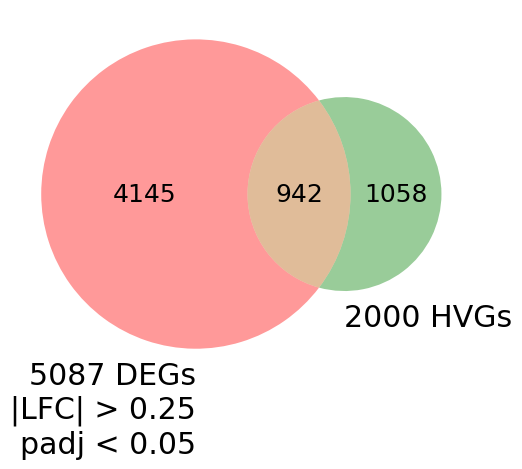

In [ ]:
left = 5087-942
right = 2000-942
venn2(subsets = (left, right, 942), 
      set_labels = ('5087 DEGs\n|LFC| > 0.25\npadj < 0.05', '2000 HVGs'))
plt.show()

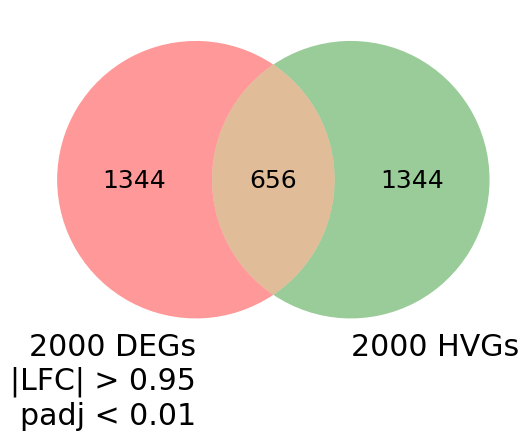

In [13]:
left = 2000-656
venn2(subsets = (left, left, 656), 
      set_labels = ('2000 DEGs\n|LFC| > 0.95\npadj < 0.01', '2000 HVGs'))
plt.show()

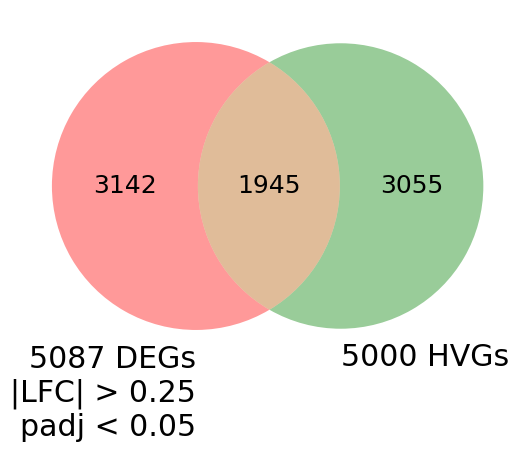

In [14]:
left = 5087-1945
right = 5000-1945
venn2(subsets = (left, right, 1945), 
      set_labels = ('5087 DEGs\n|LFC| > 0.25\npadj < 0.05', '5000 HVGs'))
plt.show()

### (OLD) Testing feature selection - DEGs with p-value threshold

In [3]:
plt.rcParams['font.size'] = 18

In [4]:
de_results = pd.read_pickle("/home/ranwyl/results_tf_project/TF_KO_NTC_DE_results.pkl")

adata_hvgs = ad.read_h5ad("/home/ranwyl/data_tf_project/tf_kos_by_2000_hvgs.h5ad")
hvgs = adata_hvgs.var.index.tolist()
hvgs = set(hvgs)

adata_degs_pval = ad.read_h5ad("/home/ranwyl/data_tf_project/tf_kos_by_5560_degs_pval.h5ad")
degs = adata_degs_pval.var.index.tolist()
degs = set(degs)

Venn diagram of 5560 DEGs with p-val < 0.0005 and 2000 HVGs

In [5]:
n_degs, n_hvgs = len(degs), len(hvgs)
n_shared_genes = len([g for g in hvgs if g in degs])
print(f"Number of DEGs: {n_degs}")
print(f"Number of HVGs: {n_hvgs}")
print(f"Intersection: {n_shared_genes}")

Number of DEGs: 5560
Number of HVGs: 2000
Intersection: 927


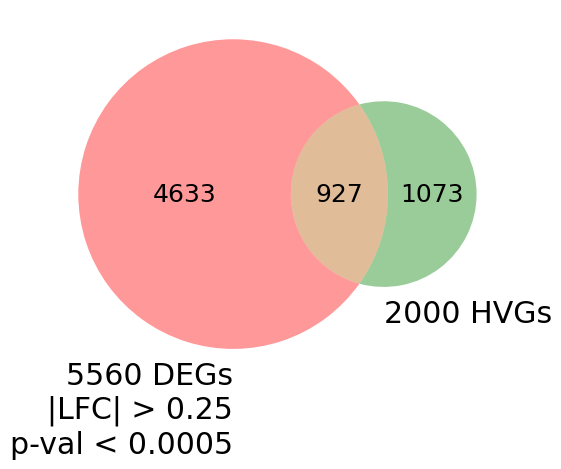

In [7]:
left = n_degs - n_shared_genes
right = n_hvgs - n_shared_genes
venn2(subsets = (left, right, n_shared_genes), 
      set_labels = ('5560 DEGs\n|LFC| > 0.25\np-val < 0.0005', '2000 HVGs'))
plt.show()

In [26]:
degs_pval_hvgs_union = degs.union(hvgs)
print(len(degs_pval_hvgs_union))

6633


Venn diagram of 5560 DEGs with p-val < 0.0005 and 5087 DEGs with p-adj < 0.05

In [8]:
adata_degs_padj = ad.read_h5ad("/home/ranwyl/data_tf_project/tf_kos_by_5087_degs.h5ad")
degs_padj = adata_degs_padj.var.index.tolist()
degs_padj = set(degs_padj)
degs_pval = degs

In [9]:
n_degs_pval, n_degs_padj = len(degs_pval), len(degs_padj)
n_shared_genes = len([g for g in degs_pval if g in degs_padj])
print(f"Number of DEGs with p-val < 0.0005: {n_degs_pval}")
print(f"Number of DEGS with p-adj < 0.05: {n_degs_padj}")
print(f"Intersection: {n_shared_genes}")

Number of DEGs with p-val < 0.0005: 5560
Number of DEGS with p-adj < 0.05: 5087
Intersection: 3996


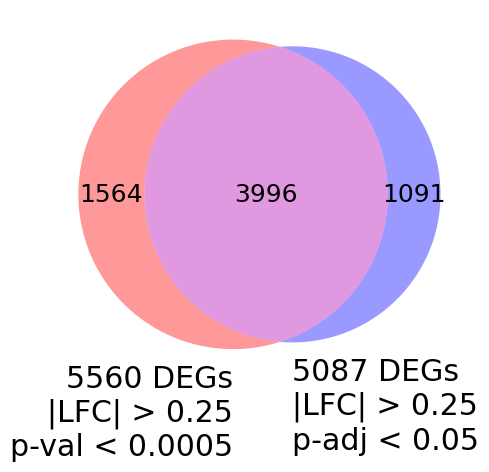

In [17]:
left = n_degs_pval - n_shared_genes
right = n_degs_padj - n_shared_genes
venn2(subsets = (left, right, n_shared_genes), 
      set_labels = ('5560 DEGs\n|LFC| > 0.25\np-val < 0.0005', 
                    '5087 DEGs\n|LFC| > 0.25\np-adj < 0.05'),
      set_colors = ("red", "blue"), 
      alpha=0.4)
plt.show()

Subset to batch ALPHA

In [19]:
def get_alpha_degs_pval(deg_df, alpha_tf_list, lfc_threshold=0.25, pval_threshold=0.0005):
    deg_set = set()
    for pert in alpha_tf_list:
        l2fc_col = f"{pert}_log2FoldChange"
        pval_col = f"{pert}_pvalue"
        deg_set.update(deg_df.loc[(abs(deg_df[l2fc_col]) > lfc_threshold) 
                        & (deg_df[pval_col] < pval_threshold)].index)
    return deg_set

In [20]:
adata_tfs = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_TF_KO_Batch_Normalized.h5ad")
adata_tfs_alpha = adata_tfs[adata_tfs.obs["run"] == "ALPHA"].copy()

In [22]:
alpha_tfs = adata_tfs[adata_tfs.obs["run"] == "ALPHA"].obs["gene_target"].unique().tolist()
alpha_degs_from_dge = get_alpha_degs_pval(de_results, alpha_tfs)
print(len(alpha_degs_from_dge))

5529


In [23]:
alpha_degs = degs_pval.intersection(alpha_degs_from_dge)
print(len(alpha_degs))

5524


In [24]:
sc.pp.highly_variable_genes(adata_tfs_alpha, n_top_genes=2000, subset=True, flavor='seurat_v3', layer='counts')
alpha_hvgs = adata_tfs_alpha.var.index.tolist()
alpha_hvgs = set(alpha_hvgs)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


In [25]:
n_degs = len(alpha_degs)
n_hvgs = len(alpha_hvgs)
n_shared_genes = len([g for g in alpha_hvgs if g in alpha_degs])
print(f"Number of ALPHA DEGs with p-val < 0.0005: {n_degs}")
print(f"Number of HVGs in ALPHA TF KO dataset: {n_hvgs}")
print(f"Shared genes: {n_shared_genes}")

Number of ALPHA DEGs with p-val < 0.0005: 5524
Number of HVGs in ALPHA TF KO dataset: 2000
Shared genes: 922


# MDE

### MDE functions

In [6]:
def compute_mean_normalized_profile(adata, group_indices):
    mean_vector = adata[group_indices, :].X.mean(axis=0)
    normalized_mean_vector = (mean_vector - np.mean(mean_vector)) / np.std(mean_vector)
    return normalized_mean_vector.A1 if hasattr(normalized_mean_vector, 'A1') else normalized_mean_vector

def tf_compute_MDE(adata, label_points=False, leiden_neighbors=5, preserve='neighbors', spectral=False):
    adata = adata.copy()
    gene_target_groups = adata.obs.groupby('gene_target').indices
    # Changed code to no longer compute mean normalized profiles in parallel -Robin
    mean_profiles = [compute_mean_normalized_profile(adata, indices) for indices in gene_target_groups.values()]
    mean_profiles_array = np.array(mean_profiles)

    # Compute MDE
    pymde.seed(42) # Added by Robin to make pymde.preserve_neighbors() deterministic
    mde = None
    embedding = None
    if preserve == "neighbors":
        if spectral:
            spectral_embedding = SpectralEmbedding(
                n_components=30,  # Ensure this matches the pymde embedding dimension
                affinity='nearest_neighbors',
                n_neighbors=10,
                eigen_solver='arpack',
                random_state=42 # Added by Robin to make sklearn.SpectralEmbedding deterministic
            )
            initial_embedding = spectral_embedding.fit_transform(mean_profiles_array)
            mde = pymde.preserve_neighbors(initial_embedding, repulsive_fraction=15, n_neighbors = 15)
            embedding = mde.embed(max_iter=2000,print_every=100,verbose=True)
        else:
            mde = pymde.preserve_neighbors(mean_profiles_array, repulsive_fraction=15, n_neighbors=5)
            embedding = mde.embed(max_iter=4000,print_every=100,verbose=True)
    else:
        mde = pymde.preserve_distances(mean_profiles_array)
        embedding = mde.embed(max_iter=1000,print_every=100,verbose=True)

    # Run Leiden clustering on the embeddings
    knn_graph = kneighbors_graph(embedding, n_neighbors=leiden_neighbors, include_self=False)
    sources, targets = knn_graph.nonzero()
    g = ig.Graph(directed=False)
    g.add_vertices(embedding.shape[0])
    g.add_edges(zip(sources, targets))
    partition = leidenalg.find_partition(g, leidenalg.RBConfigurationVertexPartition, 
                                         seed=42 # Added by Robin to make leidenalg.find_partition() deterministic
                                         )
    
    # Get cluster labels and make pairwise correlation plot
    clusters = np.array(partition.membership)
    gene_targets = list(gene_target_groups.keys())
    embedding_df = pd.DataFrame(embedding, columns=['x', 'y'])
    embedding_df['gene_target'] = gene_targets
    embedding_df['cluster'] = clusters
    embedding_df['cluster'] = embedding_df['cluster'].astype(str)
    cluster_groups = embedding_df.groupby('cluster')
    centroids = cluster_groups[['x', 'y']].mean()
    pairwise_distances = pd.DataFrame(
        squareform(pdist(centroids, metric='euclidean')),
        index=centroids.index,
        columns=centroids.index
    )
    sns.clustermap(pairwise_distances, cmap='PuBuGn')
    plt.title('Pairwise Distance Matrix of Cluster Centroids')
    plt.show()

    # Plot using Plotly with Pastel colormap for discrete clusters
    fig = px.scatter(embedding_df, x='x', y='y', text='gene_target', color='cluster',
                     hover_data={'x': True, 'y': True, 'gene_target': True},
                     title='MDE Embedding of Mean Normalized Profiles',
                     color_discrete_sequence=px.colors.qualitative.Bold)
    fig.update_traces(marker=dict(size=7,opacity=0.7),textposition='middle center',textfont=dict(size=4))
    
    fig.update_layout(
        showlegend=True,
        xaxis=dict(visible=False),
        yaxis=dict(visible=False),
        plot_bgcolor='white',
        width=1200,  # Increase plot width
        height=1000,  # Increase plot height
        legend_title_text='Cluster',
        coloraxis_showscale=False
    )
    if not label_points: # Added by Robin
        fig.update_traces(text=None)
   
    fig.show()
    
    return adata, embedding, clusters, mean_profiles_array, embedding_df

def gene_targets_per_cluster(embedding_df):
    """
    Return DataFrame where each column contains the perturbations in a cluster.
    """
    cluster_nums = max([int(n) for n in set(embedding_df["cluster"].tolist())])
    cluster_dict = dict()
    for i in range(cluster_nums+1):
        cluster = embedding_df[embedding_df["cluster"] == str(i)]["gene_target"].tolist()
        cluster_dict[i] = cluster
    # Pad all columns to be the same length
    max_n_perts = max(len(cluster_dict[i]) for i in range(len(cluster_dict)))
    cluster_dict = {cluster:(perts + [""]*(max_n_perts-len(perts))) for cluster, perts in cluster_dict.items()}
    perts_in_cluster_df = pd.DataFrame(cluster_dict)
    return perts_in_cluster_df

def plot_n_perts_per_cluster(perts_in_cluster_df, title, ymax=None):
    n_perts_per_cluster = perts_in_cluster_df.nunique().tolist()
    xvals = [i for i in range(len(n_perts_per_cluster))]
    ax = sns.barplot(x=xvals, y=n_perts_per_cluster)
    ax.set_xlabel("Leiden cluster")
    ax.set_ylabel("Number of TF KOs in cluster")
    if ymax:
        ax.set_ylim(0, ymax)
    ax.set_title(title)

### MDE on 5087 DEG dataset

In [ ]:
adata_5087 = ad.read_h5ad("/home/ranwyl/data_tf_project/tf_kos_by_5087_degs.h5ad")

May 14 05:08:38 PM: Fitting a centered embedding into R^2, for a graph with 652 items and 132630 edges.
May 14 05:08:38 PM: `embed` method parameters: eps=1.0e-05, max_iter=2000, memory_size=10
May 14 05:08:38 PM: iteration 0000 | distortion 0.723044 | residual norm 0.0614954 | step length 17.4185 | percent change 2.9663
May 14 05:08:40 PM: iteration 0100 | distortion 0.136012 | residual norm 0.000187954 | step length 1 | percent change 0.343435
May 14 05:08:42 PM: iteration 0200 | distortion 0.134745 | residual norm 0.00011235 | step length 1 | percent change 0.216105
May 14 05:08:43 PM: iteration 0300 | distortion 0.134101 | residual norm 7.14496e-05 | step length 1 | percent change 0.298043
May 14 05:08:44 PM: iteration 0400 | distortion 0.133705 | residual norm 0.000110616 | step length 1 | percent change 0.614268
May 14 05:08:46 PM: iteration 0500 | distortion 0.133302 | residual norm 3.0185e-05 | step length 1 | percent change 0.328989
May 14 05:08:47 PM: iteration 0600 | distort

/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:530: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:530: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix


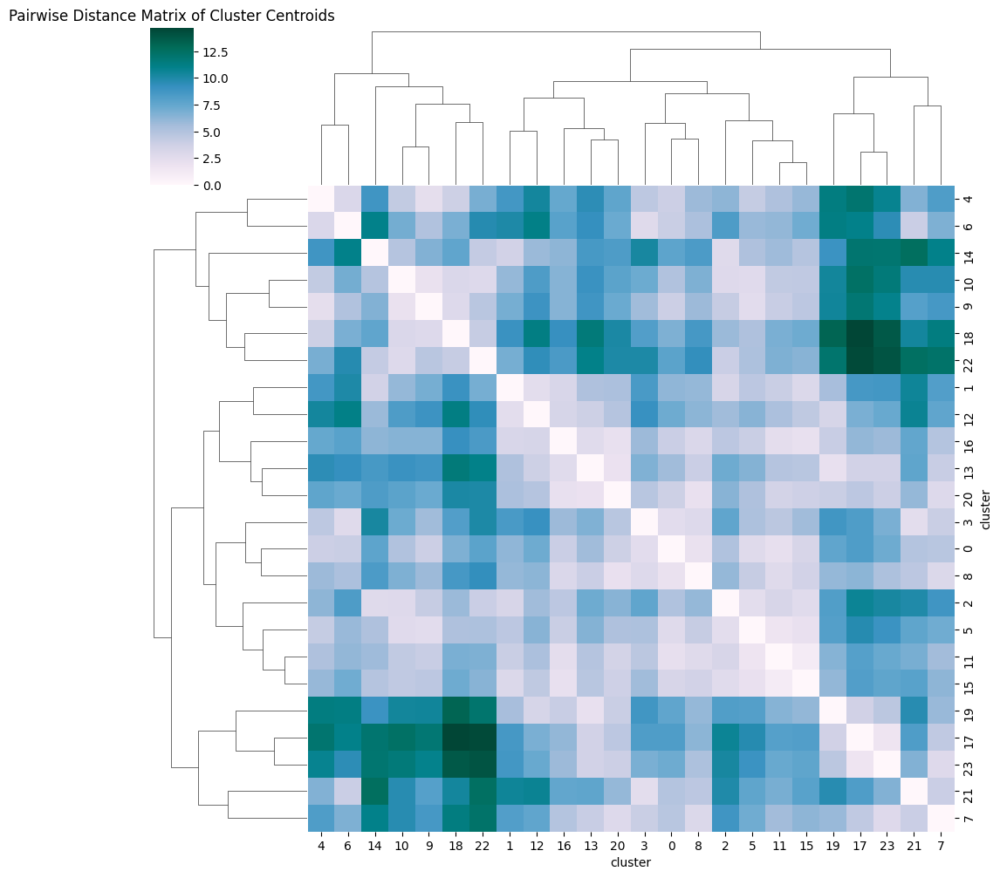

In [ ]:
mde_5087_8 = tf_compute_MDE(adata_5087, label_points=False, spectral=True, leiden_neighbors=8)

In [ ]:
_, _, _, _, embedding_df_5087_8 = mde_5087_8
embedding_df_5087_8.head()

,x,y,gene_target,cluster
0,-3.793770,-2.365308,ADNP2,7
1,0.901927,-6.154710,AEBP1,6
2,3.388259,-1.119113,AHR,9
3,-0.600258,-2.202051,AIRE,0
4,-4.958496,-1.321490,AKAP8,7


In [ ]:
perts_in_cluster_5087_8 = gene_targets_per_cluster(embedding_df_5087_8)
perts_in_cluster_5087_8.head()

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
0,AIRE,AKAP8L,CDX1,ASCL5,BCL6B,ATOH7,AEBP1,ADNP2,ARNT2,AHR,...,ASH1L,DUXA,BACH2,ASCL1,BHLHE40,BHLHE41,CREB5,ASCL2,ASCL3,EBF2
1,ARX,ATMIN,CREB3L3,BARHL1,BSX,GMEB2,ANKZF1,AKAP8,ESRRB,CCDC17,...,CEBPB,FOXE3,CREBL2,FLYWCH1,DEAF1,ETV3L,LHX9,ATF6B,DLX6,KLF1
2,BHLHA9,BHLHE22,CREM,CBX2,DMRT3,GRHL3,ARID2,ARID3B,ETV5,FOXI2,...,HHEX,FOXQ1,DMRTA2,GTF3A,ESRRA,FOXD3,MESP2,CENPX,GATAD2A,NANOG
3,DBX2,CAMTA2,DMBX1,CEBPE,ETV1,HIVEP2,ARNT,BAZ2A,FOXD4L5,FOXM1,...,HNF1A,IRX5,DMRTB1,HMX2,ESRRG,FOXO1,PAX6,DLX4,HES7,NANOGP8
4,ELK1,CEBPA,EHF,EMX1,FIGLA,HLF,BHLHA15,CEBPD,GTF2IRD1,GLIS3,...,IKZF5,ISL1,FOXD4,HOXD13,GATA4,IRF6,RAG1,FOXH1,LIN28B,PITX2


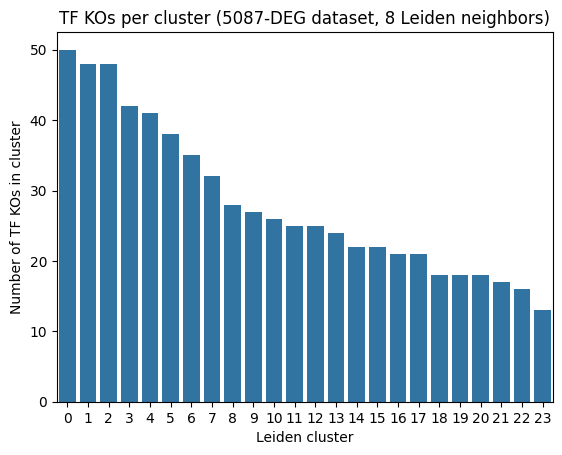

In [ ]:
_ = plot_n_perts_per_cluster(perts_in_cluster_5087_8, "TF KOs per cluster (5087-DEG dataset, 8 Leiden neighbors)")

In [ ]:
perts_in_cluster_5087_8.to_csv("/home/ranwyl/results_tf_project/tf_ko_clusters_5087_degs_8_nbrs.csv")

10 neighbors

May 08 02:10:14 AM: Fitting a centered embedding into R^2, for a graph with 652 items and 132630 edges.
May 08 02:10:14 AM: `embed` method parameters: eps=1.0e-05, max_iter=2000, memory_size=10
May 08 02:10:14 AM: iteration 0000 | distortion 0.723044 | residual norm 0.0614954 | step length 17.4185 | percent change 2.9663
May 08 02:10:16 AM: iteration 0100 | distortion 0.136012 | residual norm 0.000187954 | step length 1 | percent change 0.343435
May 08 02:10:17 AM: iteration 0200 | distortion 0.134745 | residual norm 0.00011235 | step length 1 | percent change 0.216105
May 08 02:10:19 AM: iteration 0300 | distortion 0.134101 | residual norm 7.14496e-05 | step length 1 | percent change 0.298043
May 08 02:10:21 AM: iteration 0400 | distortion 0.133705 | residual norm 0.000110616 | step length 1 | percent change 0.614268
May 08 02:10:23 AM: iteration 0500 | distortion 0.133302 | residual norm 3.0185e-05 | step length 1 | percent change 0.328989
May 08 02:10:24 AM: iteration 0600 | distort

/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:530: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:530: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix


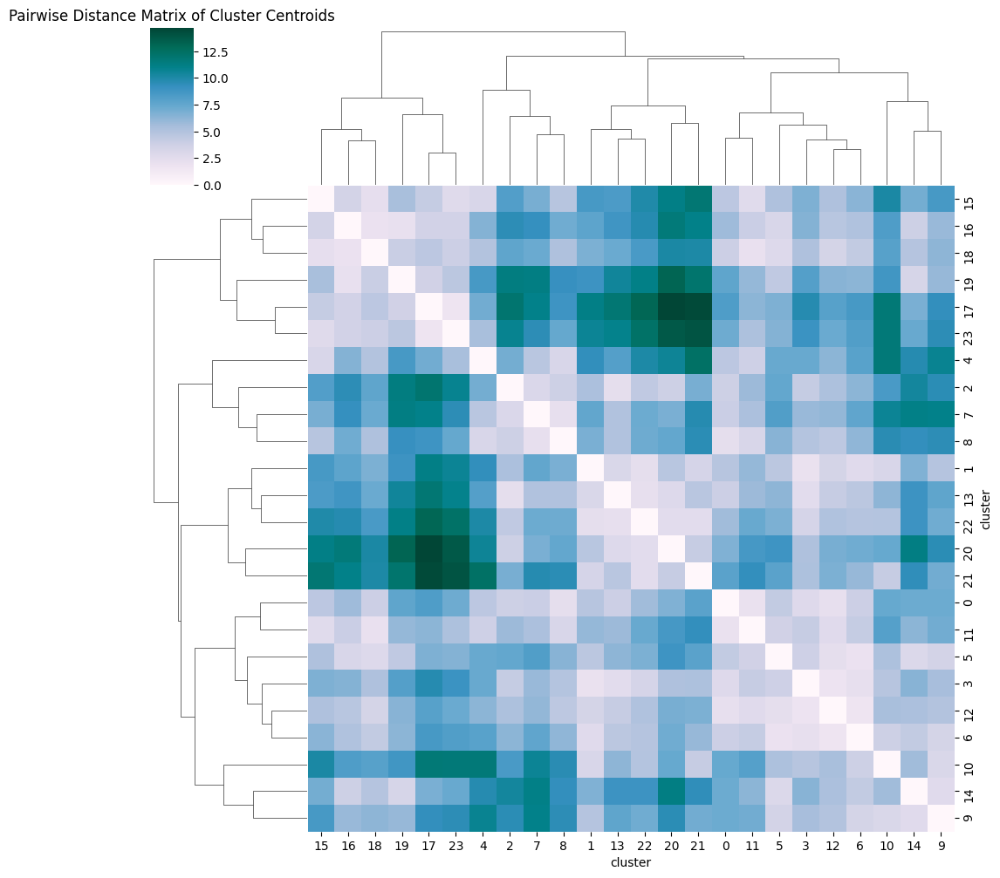

In [ ]:
mde_5087_10 = tf_compute_MDE(adata_5087, label_points=False, spectral=True, leiden_neighbors=10)

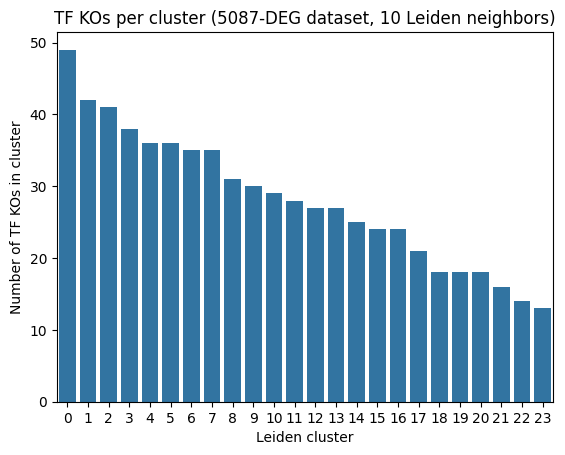

In [ ]:
_, _, _, _, embedding_df_5087_10 = mde_5087_10
perts_in_cluster_5087_10 = gene_targets_per_cluster(embedding_df_5087_10)
_ = plot_n_perts_per_cluster(perts_in_cluster_5087_10, "TF KOs per cluster (5087-DEG dataset, 10 Leiden neighbors)")

### MDE on 2000 HVG dataset

In [ ]:
adata_2000 = ad.read_h5ad("/home/ranwyl/data_tf_project/tf_kos_by_2000_hvgs.h5ad")

In [ ]:
# mde_2000_8 = tf_compute_MDE(adata_2000, label_points=False, spectral=True, leiden_neighbors=8)

In [ ]:
_, _, _, _, embedding_df_2000_8 = mde_2000_8
perts_in_cluster_2000_8 = gene_targets_per_cluster(embedding_df_2000_8)
perts_in_cluster_2000_8.head()

,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
0,AEBP1,ARID2,ATF6B,CREB5,ARX,CC2D1A,ARHGAP35,AKAP8,BAZ2A,ARNT,...,ATOH1,AIRE,ESX1,AKAP8L,ARID3A,ISL1,ESR1,BHLHA9,KLF4,CAMTA2
1,ATOH7,BCL6B,ESR2,DMRT2,ASCL5,CEBPA,ARNT2,BHLHE40,BHLHE22,CENPS,...,BSX,ARID3B,FOXQ1,CEBPB,CDX1,MEOX2,ETS2,FAM200B,PAX9,NCOA3
2,BACH2,BHLHE41,FOXE3,DMRTB1,BARHL1,CEBPE,BARX1,CBX2,FOSL1,CRX,...,KLF6,DR1,HEY1,FOXO1,NFE2L1,PCGF6,KDM2A,LHX9,TIGD7,PRDM8
3,CREB3L4,DMRT3,FOXJ1,ETV5,BHLHA15,DBX2,CTCFL,CEBPD,FOXD4L5,DLX4,...,LHX5,DRAP1,LEF1,GATAD2B,RFX8,RFX7,RELB,MEIS1,ZBTB26,SP140L
4,CREBL2,EPAS1,FOXS1,FOXK2,CREB3L3,DLX6,DLX2,CENPB,FOXN2,ELK1,...,NFX1,ESRRG,REST,GTF3A,SOX30,SHOX2,TET1,MYPOP,ZNF326,ZNF334


In [ ]:
perts_in_cluster_2000_8.to_csv("/home/ranwyl/results_tf_project/tf_ko_clusters_2000_hvgs_8_nbrs.csv")

In [ ]:
perts_in_cluster_2000_8 = pd.read_csv("/home/ranwyl/results_tf_project/tf_ko_clusters_2000_hvgs_8_nbrs.csv", header=0, index_col=0)

In [ ]:
perts_in_cluster_2000_8.head()

,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
0,AEBP1,ARID2,ATF6B,CREB5,ARX,CC2D1A,ARHGAP35,AKAP8,BAZ2A,ARNT,...,ATOH1,AIRE,ESX1,AKAP8L,ARID3A,ISL1,ESR1,BHLHA9,KLF4,CAMTA2
1,ATOH7,BCL6B,ESR2,DMRT2,ASCL5,CEBPA,ARNT2,BHLHE40,BHLHE22,CENPS,...,BSX,ARID3B,FOXQ1,CEBPB,CDX1,MEOX2,ETS2,FAM200B,PAX9,NCOA3
2,BACH2,BHLHE41,FOXE3,DMRTB1,BARHL1,CEBPE,BARX1,CBX2,FOSL1,CRX,...,KLF6,DR1,HEY1,FOXO1,NFE2L1,PCGF6,KDM2A,LHX9,TIGD7,PRDM8
3,CREB3L4,DMRT3,FOXJ1,ETV5,BHLHA15,DBX2,CTCFL,CEBPD,FOXD4L5,DLX4,...,LHX5,DRAP1,LEF1,GATAD2B,RFX8,RFX7,RELB,MEIS1,ZBTB26,SP140L
4,CREBL2,EPAS1,FOXS1,FOXK2,CREB3L3,DLX6,DLX2,CENPB,FOXN2,ELK1,...,NFX1,ESRRG,REST,GTF3A,SOX30,SHOX2,TET1,MYPOP,ZNF326,ZNF334


In [ ]:
n_perts_per_cluster_2000_8 = perts_in_cluster_2000_8.nunique().tolist()
print(n_perts_per_cluster_2000_8)

[49, 48, 46, 39, 38, 36, 35, 34, 33, 32, 31, 30, 28, 26, 23, 22, 18, 14, 14, 14, 13, 12, 12, 10, 10, 10]


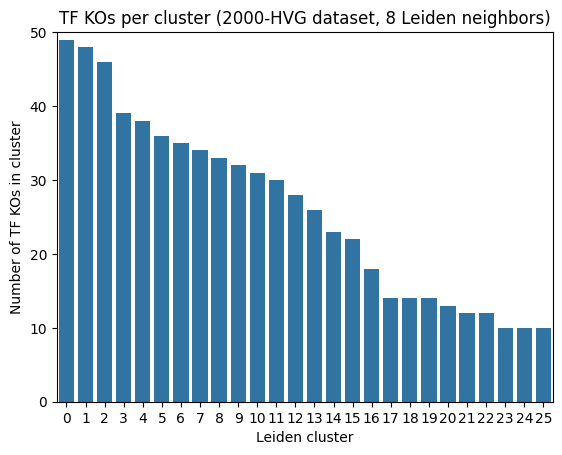

In [ ]:
plot_n_perts_per_cluster(perts_in_cluster_2000_8, 
                         title="TF KOs per cluster (2000-HVG dataset, 8 Leiden neighbors)", ymax=50)

10 Leiden neighbors

In [ ]:
# mde_2000_10 = tf_compute_MDE(adata_2000, label_points=False, spectral=True, leiden_neighbors=10)

In [ ]:
_, _, _, _, embedding_df_2000_10 = mde_2000_10
perts_in_cluster_2000_10 = gene_targets_per_cluster(embedding_df_2000_10)
perts_in_cluster_2000_10.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,ARID2,AEBP1,ATF6B,ASCL5,BCL6B,CREB5,ARNT,ARHGAP35,AHR,AKAP8,BAZ2A,CC2D1A,ADNP2,ASCL1,BHLHA9,DACH2,AIRE,ATMIN,CSRNP2,ARID3A
1,ARX,ATOH7,FOXE3,ASH1L,BHLHE41,DMRT2,ATOH1,ARNT2,AKAP8L,BHLHE40,BHLHE22,CEBPA,ANKZF1,FLYWCH1,ESR1,DEAF1,ARID3B,CHAMP1,DUXA,CDX1
2,BARHL1,BACH2,FOXJ1,BHLHA15,CAMTA2,DMRTB1,BSX,BARX1,ASCL3,CBX2,FOSL1,CEBPE,ASCL2,HMX2,ETS2,ETS1,CENPS,DNMT1,ERG,NFE2L1
3,CREB3L3,CREB3L4,FOXQ1,DMRTC2,DMRT3,ETV5,ELK1,CTCFL,CEBPB,CEBPD,FOXD4L5,DBX2,CCDC17,HOXD13,FAM200B,FOXH1,CRX,E2F4,ESRRB,NR1I3
4,EPAS1,CREBL2,HEY1,GMEB2,ERF,FOXK2,HES3,DLX2,EBF3,CENPB,FOXN2,DLX6,CENPX,KLF1,KDM2A,HEY2,DLX4,EBF2,HIVEP2,RFX8


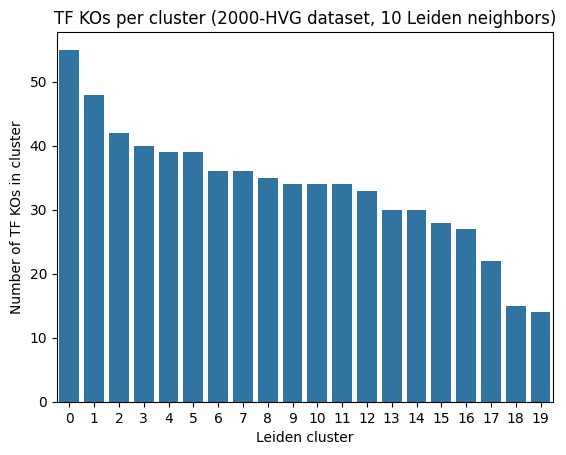

In [ ]:
plot_n_perts_per_cluster(perts_in_cluster_2000_10, "TF KOs per cluster (2000-HVG dataset, 10 Leiden neighbors)")

In [ ]:
perts_in_cluster_2000_10.to_csv("/home/ranwyl/results_tf_project/tf_ko_clusters_2000_hvgs_10_nbrs.csv")

15 neighbors

May 07 09:34:11 PM: Fitting a centered embedding into R^2, for a graph with 652 items and 128373 edges.
May 07 09:34:11 PM: `embed` method parameters: eps=1.0e-05, max_iter=2000, memory_size=10
May 07 09:34:11 PM: iteration 0000 | distortion 0.730711 | residual norm 0.0671962 | step length 2.96018 | percent change 0.550839
May 07 09:34:14 PM: iteration 0100 | distortion 0.136367 | residual norm 0.000173286 | step length 1 | percent change 0.241956
May 07 09:34:16 PM: iteration 0200 | distortion 0.135342 | residual norm 0.000172898 | step length 1 | percent change 0.829554
May 07 09:34:17 PM: iteration 0300 | distortion 0.135035 | residual norm 4.16185e-05 | step length 1 | percent change 0.278521
May 07 09:34:20 PM: Converged in 394 iterations, with residual norm 9.76696e-06
May 07 09:34:20 PM: Finished fitting in 8.631 seconds and 394 iterations.
May 07 09:34:20 PM: average distortion 0.135 | residual norm 9.8e-06


/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:530: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix

/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:530: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



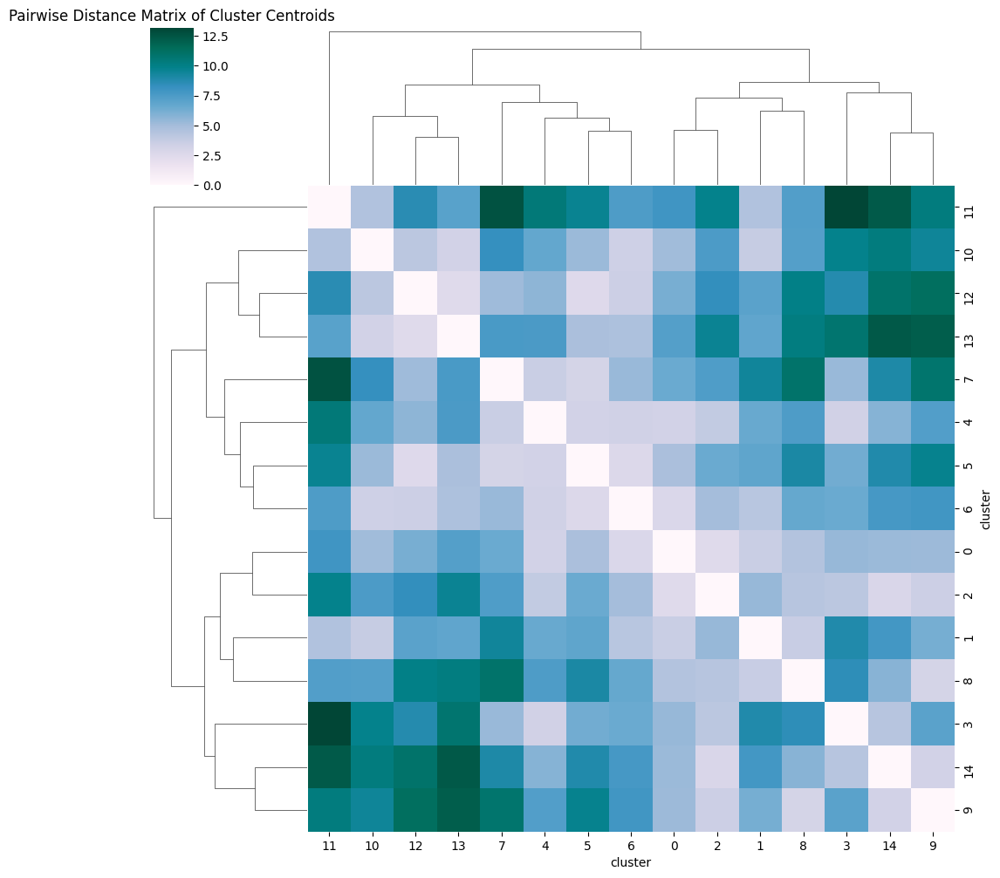

In [ ]:
mde_2000_15 = tf_compute_MDE(adata_2000, label_points=False, spectral=True, leiden_neighbors=15)

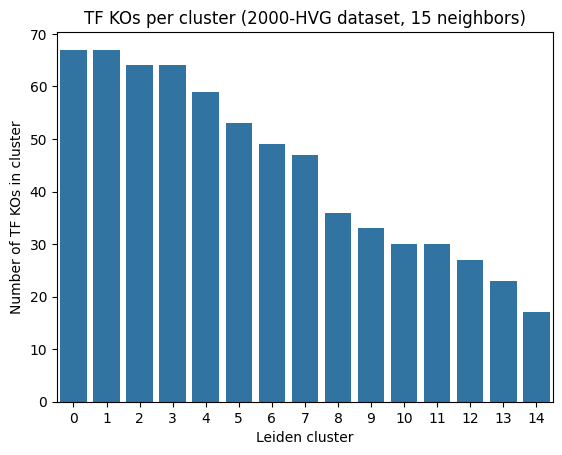

In [ ]:
_, _, _, _, embedding_df_2000_15 = mde_2000_15
perts_in_cluster_2000_15 = gene_targets_per_cluster(embedding_df_2000_15)
plot_n_perts_per_cluster(perts_in_cluster_2000_15, "TF KOs per cluster (2000-HVG dataset, 15 neighbors)")

### MDE on 2008-DEG dataset

May 23 03:57:00 AM: Fitting a centered embedding into R^2, for a graph with 652 items and 131486 edges.
May 23 03:57:00 AM: `embed` method parameters: eps=1.0e-05, max_iter=2000, memory_size=10
May 23 03:57:00 AM: iteration 0000 | distortion 1.296078 | residual norm 0.181858 | step length 1.05007 | percent change 0.528825
May 23 03:57:04 AM: iteration 0100 | distortion 0.143664 | residual norm 0.000186976 | step length 1 | percent change 0.196842
May 23 03:57:06 AM: iteration 0200 | distortion 0.141551 | residual norm 0.000155575 | step length 1 | percent change 0.166795
May 23 03:57:09 AM: iteration 0300 | distortion 0.140954 | residual norm 0.000116975 | step length 1 | percent change 0.222779
May 23 03:57:10 AM: iteration 0400 | distortion 0.140404 | residual norm 6.3127e-05 | step length 1 | percent change 0.180992
May 23 03:57:12 AM: iteration 0500 | distortion 0.140158 | residual norm 5.87271e-05 | step length 1 | percent change 0.0993096
May 23 03:57:13 AM: iteration 0600 | dist

/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:530: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:530: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix


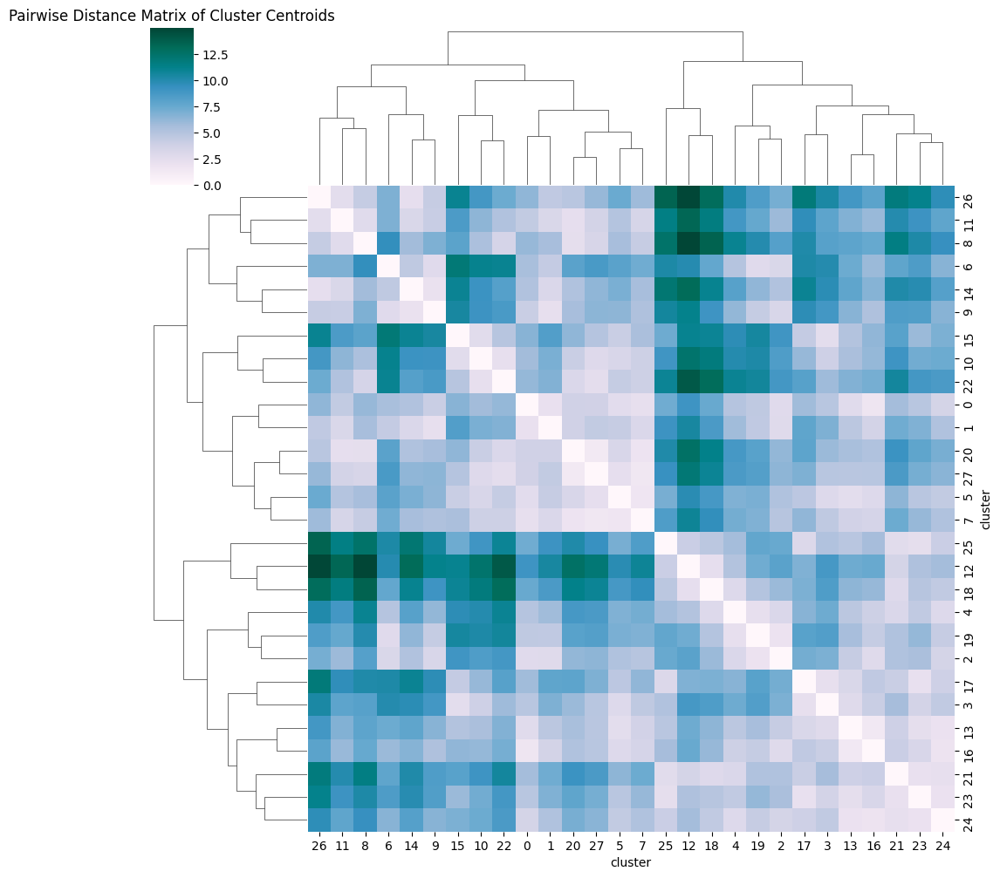

In [8]:
adata_2008 = adata_tfs_degs_2008
mde_2008_8 = tf_compute_MDE(adata_2008, label_points=False, spectral=True, leiden_neighbors=8)

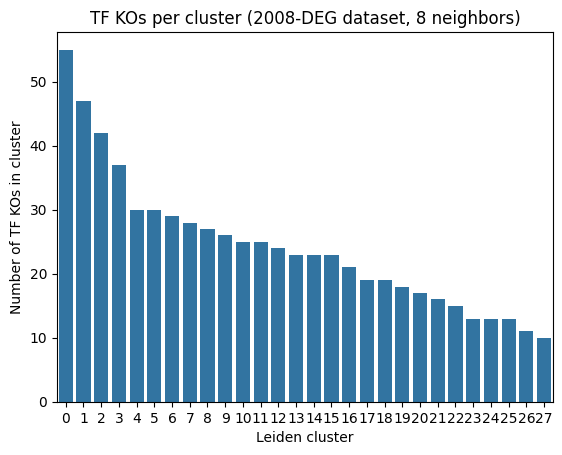

In [9]:
_, _, _, _, embedding_df_2008_8 = mde_2008_8
perts_in_cluster_2008_8 = gene_targets_per_cluster(embedding_df_2008_8)
plot_n_perts_per_cluster(perts_in_cluster_2008_8, "TF KOs per cluster (2008-DEG dataset, 8 neighbors)")

## Compare TF KO cluster membership between 2008-DEG MDE and 2000-HVG MDE

In [11]:
def compare_cluster_dfs(df1, df1_name, df2, df2_name):
    """
    Given two DataFrames where each column represents a TF KO cluster, 
    compare each TF KO cluster in df1 to each TF KO cluster in df2 using Jaccard similarity. 
    Output two DataFrames, one recording the Jaccard similarity
    and one recording the size of the set intersection between the two clusters.
    """
    dict1 = {int(col): df1[col].tolist() for col in df1.columns}
    dict2 = {int(col): df2[col].tolist() for col in df2.columns}
    jaccard_array = np.zeros((len(dict1), len(dict2)))
    intersection_array = np.zeros((len(dict1), len(dict2)), dtype=int)
    for i, perts1 in sorted(dict1.items()):
        set1 = set(perts1)
        for j, perts2 in sorted(dict2.items()):
            set2 = set(perts2)
            # Compute Jaccard index
            intersection = len(set1.intersection(set2))
            union = len(set1.union(set2))
            jaccard_array[i, j] = round(intersection/union, 3) if union != 0 else 0
            # Record intersection
            intersection_array[i, j] = intersection
    # Create DataFrame
    row_names = [f"{df1_name}_CL_{i}" for i in range(len(dict1))]
    col_names = [f"{df2_name}_CL_{j}" for j in range(len(dict2))]
    jaccard_df = pd.DataFrame(jaccard_array, columns=col_names, index=row_names)
    intersection_df = pd.DataFrame(intersection_array, columns=col_names, index=row_names)
    return jaccard_df, intersection_df

In [14]:
clusters_degs = perts_in_cluster_2008_8
clusters_hvgs = pd.read_csv("/home/ranwyl/results_tf_project/tf_ko_clusters_2000_hvgs_8_nbrs.csv", index_col=0)

In [70]:
# 2008 DEGs with p-adj < 0.01 and |LFC| > 0.95 versus 2000 HVGs
jaccard_degs_rows, intersection_degs_rows = compare_cluster_dfs(clusters_degs, "DEG", clusters_hvgs, "HVG")
jaccard_hvgs_rows, intersection_hvgs_rows = compare_cluster_dfs(clusters_hvgs, "HVG", clusters_degs, "DEG")

In [71]:
jaccard_degs_rows.head()

,HVG_CL_0,HVG_CL_1,HVG_CL_2,HVG_CL_3,HVG_CL_4,HVG_CL_5,HVG_CL_6,HVG_CL_7,HVG_CL_8,HVG_CL_9,...,HVG_CL_16,HVG_CL_17,HVG_CL_18,HVG_CL_19,HVG_CL_20,HVG_CL_21,HVG_CL_22,HVG_CL_23,HVG_CL_24,HVG_CL_25
DEG_CL_0,0.040,0.096,0.020,0.056,0.011,0.096,0.023,0.023,0.035,0.012,...,0.014,0.015,0.015,0.000,0.000,0.000,0.015,0.032,0.016,0.000
DEG_CL_1,0.021,0.033,0.081,0.012,0.090,0.092,0.025,0.025,0.013,0.026,...,0.000,0.000,0.000,0.017,0.053,0.000,0.000,0.000,0.000,0.018
DEG_CL_2,0.022,0.011,0.023,0.066,0.013,0.040,0.013,0.041,0.027,0.042,...,0.034,0.018,0.000,0.000,0.019,0.019,0.000,0.040,0.020,0.000
DEG_CL_3,0.049,0.037,0.000,0.027,0.000,0.000,0.108,0.014,0.014,0.113,...,0.000,0.020,0.020,0.000,0.000,0.000,0.021,0.022,0.000,0.000
DEG_CL_4,0.039,0.013,0.000,0.030,0.015,0.000,0.000,0.085,0.016,0.016,...,0.000,0.000,0.023,0.000,0.049,0.000,0.024,0.026,0.000,0.000


In [73]:
jaccard_hvgs_rows.head()

,DEG_CL_0,DEG_CL_1,DEG_CL_2,DEG_CL_3,DEG_CL_4,DEG_CL_5,DEG_CL_6,DEG_CL_7,DEG_CL_8,DEG_CL_9,...,DEG_CL_18,DEG_CL_19,DEG_CL_20,DEG_CL_21,DEG_CL_22,DEG_CL_23,DEG_CL_24,DEG_CL_25,DEG_CL_26,DEG_CL_27
HVG_CL_0,0.040,0.021,0.022,0.049,0.039,0.013,0.040,0.027,0.027,0.000,...,0.015,0.015,0.015,0.000,0.016,0.016,0.051,0.000,0.017,0.035
HVG_CL_1,0.096,0.033,0.011,0.037,0.013,0.013,0.041,0.086,0.014,0.014,...,0.000,0.015,0.032,0.016,0.016,0.017,0.017,0.000,0.017,0.000
HVG_CL_2,0.020,0.081,0.023,0.000,0.000,0.041,0.042,0.014,0.043,0.059,...,0.016,0.049,0.033,0.016,0.000,0.000,0.017,0.017,0.000,0.000
HVG_CL_3,0.056,0.012,0.066,0.027,0.030,0.030,0.046,0.047,0.000,0.000,...,0.000,0.018,0.018,0.019,0.019,0.061,0.000,0.000,0.042,0.000
HVG_CL_4,0.011,0.090,0.013,0.000,0.015,0.015,0.031,0.031,0.000,0.085,...,0.018,0.077,0.038,0.000,0.019,0.020,0.000,0.000,0.000,0.000


In [81]:
def build_cluster_comparison_df(jaccard_df, intersection_df):
    label1 = jaccard_df.index[0].split("_")[0]
    label2 = jaccard_df.columns[0].split("_")[0]
    max_jaccard_index = list(jaccard_df.max(axis=1))
    max_intersection = list(intersection_df.max(axis=1))
    max_cluster_num = list(jaccard_df.idxmax(axis=1))
    max_cluster_num = [n.split("_")[-1] for n in max_cluster_num]
    comparison_dict = {i: [int(max_cluster_num[i]), max_jaccard_index[i], max_intersection[i]] 
                        for i in range(len(max_cluster_num))}
    comparison_df = pd.DataFrame.from_dict(comparison_dict, orient="index", 
                                           columns=[f"Matching {label2}_CL", "Jaccard Index", "Intersection Size"])
    comparison_df.index.name = f"{label1}_CL"
    return comparison_df

In [82]:
degs_match_hvgs = build_cluster_comparison_df(jaccard_degs_rows, intersection_degs_rows)
display(degs_match_hvgs)

,Matching HVG_CL,Jaccard Index,Intersection Size
DEG_CL,,,
0,1,0.096,9
1,5,0.092,7
2,3,0.066,5
3,9,0.113,7
4,7,0.085,5
5,6,0.066,4
6,18,0.049,3
7,1,0.086,6
8,15,0.195,8


In [83]:
hvgs_match_degs = build_cluster_comparison_df(jaccard_hvgs_rows, intersection_hvgs_rows)
display(hvgs_match_degs)

,Matching DEG_CL,Jaccard Index,Intersection Size
HVG_CL,,,
0,16,0.077,5
1,0,0.096,9
2,1,0.081,7
3,2,0.066,5
4,1,0.090,7
5,0,0.096,8
6,3,0.108,7
7,4,0.085,5
8,11,0.055,3


In [78]:
def cluster_heatmap(cluster_comparison_df, rows_name, cols_name, title, v_min, v_max, color_map="rocket_r"):
    row_names = [i for i in range(cluster_comparison_df.shape[0])]
    col_names = [j for j in range(cluster_comparison_df.shape[1])]
    df = pd.DataFrame(cluster_comparison_df.values, columns=col_names, index=row_names)
    if v_min or v_max:
        ax = sns.heatmap(df, vmin=v_min, vmax=v_max, cmap=color_map)
    else:
        ax = sns.heatmap(df, cmap=color_map)
    ax.set_ylabel(rows_name)
    ax.set_xlabel(cols_name)
    ax.set_title(title)

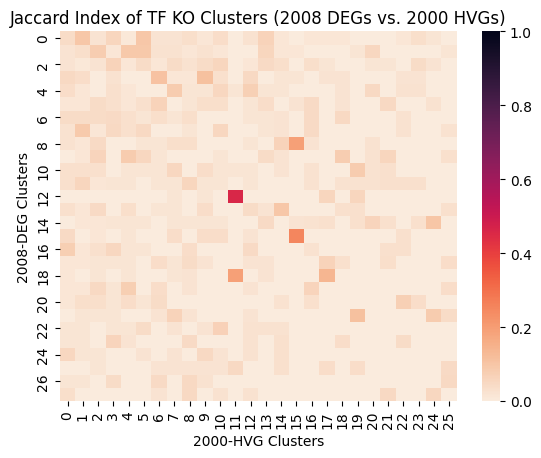

In [79]:
cluster_heatmap(jaccard_degs_rows, rows_name="2008-DEG Clusters", cols_name="2000-HVG Clusters",
    title="Jaccard Index of TF KO Clusters (2008 DEGs vs. 2000 HVGs)", v_min=0, v_max=1, color_map="rocket_r")

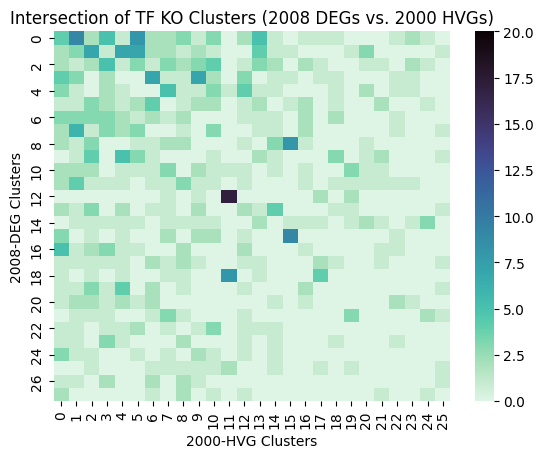

In [80]:
cluster_heatmap(intersection_degs_rows, rows_name="2008-DEG Clusters", cols_name="2000-HVG Clusters",
    title="Intersection of TF KO Clusters (2008 DEGs vs. 2000 HVGs)", v_min=0, v_max=20, color_map="mako_r")

## Compare TF KO cluster membership between DEG MDE, HVG MDE, and Mali lab study MDE

We want to compare TF KO cluster membership between the 5087-DEG MDE and 2000-HVG MDE. We also want to compare to the Mali lab study MDE. We will use the Jaccard index (intersection size divided by union size) as a metric of cluster similarity.

In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [ ]:
clusters_5087_8 = pd.read_csv("/home/ranwyl/results_tf_project/tf_ko_clusters_5087_degs_8_nbrs.csv", index_col=0)
clusters_2000_8 = pd.read_csv("/home/ranwyl/results_tf_project/tf_ko_clusters_2000_hvgs_8_nbrs.csv", index_col=0)

In [ ]:
def compare_cluster_dfs(df1, df1_name, df2, df2_name):
    """
    Given two DataFrames where each column represents a TF KO cluster, 
    compare each TF KO cluster in df1 to each TF KO cluster in df2 using Jaccard similarity. 
    Output two DataFrames, one recording the Jaccard similarity
    and one recording the size of the set intersection between the two clusters.
    """
    dict1 = {int(col): df1[col].tolist() for col in df1.columns}
    dict2 = {int(col): df2[col].tolist() for col in df2.columns}
    jaccard_array = np.zeros((len(dict1), len(dict2)))
    intersection_array = np.zeros((len(dict1), len(dict2)), dtype=int)
    for i, perts1 in sorted(dict1.items()):
        set1 = set(perts1)
        for j, perts2 in sorted(dict2.items()):
            set2 = set(perts2)
            # Compute Jaccard index
            intersection = len(set1.intersection(set2))
            union = len(set1.union(set2))
            jaccard_array[i, j] = round(intersection/union, 3) if union != 0 else 0
            # Record intersection
            intersection_array[i, j] = intersection
    # Create DataFrame
    row_names = [f"{df1_name}_CL_{i}" for i in range(len(dict1))]
    col_names = [f"{df2_name}_CL_{j}" for j in range(len(dict2))]
    jaccard_df = pd.DataFrame(jaccard_array, columns=col_names, index=row_names)
    intersection_df = pd.DataFrame(intersection_array, columns=col_names, index=row_names)
    return jaccard_df, intersection_df

In [ ]:
jaccard_8, intersection_8 = \
    compare_cluster_dfs(clusters_5087_8, "DEG", clusters_2000_8, "HVG")

In [ ]:
# Highlight the maximum value in each row
# jaccard_comparison.style.highlight_max(axis=1, color="yellow").format("{:.3f}")

In [ ]:
# intersection_comparison.style.highlight_max(axis=0, color="lightgreen")

In [ ]:
def cluster_heatmap(cluster_comparison_df, rows_name, cols_name, title, v_min, v_max, color_map="rocket_r"):
    row_names = [i for i in range(cluster_comparison_df.shape[0])]
    col_names = [j for j in range(cluster_comparison_df.shape[1])]
    df = pd.DataFrame(cluster_comparison_df.values, columns=col_names, index=row_names)
    if v_min or v_max:
        ax = sns.heatmap(df, vmin=v_min, vmax=v_max, cmap=color_map)
    else:
        ax = sns.heatmap(df, cmap=color_map)
    ax.set_ylabel(rows_name)
    ax.set_xlabel(cols_name)
    ax.set_title(title)

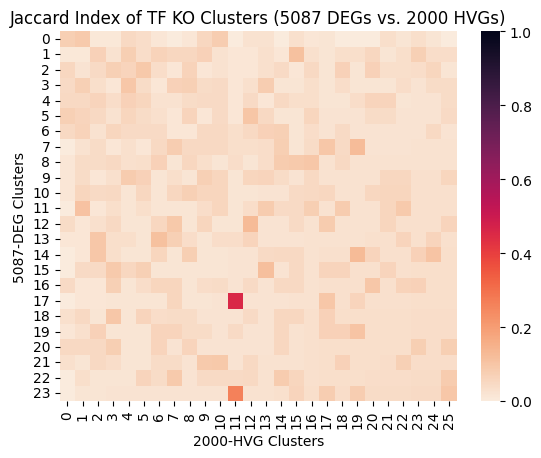

In [ ]:
p = cluster_heatmap(jaccard_8, rows_name="5087-DEG Clusters", cols_name="2000-HVG Clusters",
    title="Jaccard Index of TF KO Clusters (5087 DEGs vs. 2000 HVGs)", v_min=0, v_max=1, color_map="rocket_r")

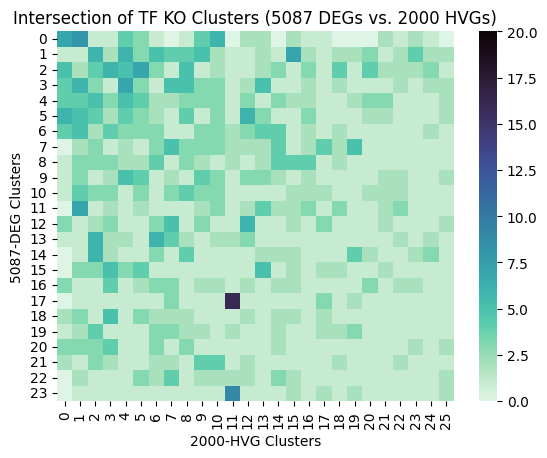

In [ ]:
p = cluster_heatmap(intersection_8, rows_name="5087-DEG Clusters", cols_name="2000-HVG Clusters",
    title="Intersection of TF KO Clusters (5087 DEGs vs. 2000 HVGs)", v_min=0, v_max=20, color_map="mako_r")

Now we will compare to the Mali Lab strong perturbation dataset clusters, specifically the TF KOs in each cluster. These clusters were generated using the TF project deterministic code that seeded all nondeterministic functions.

In [ ]:
mali_clusters = pd.read_csv("/home/ranwyl/results_tf_project/mali_lab_tf_ko_clusters_deterministic.csv", index_col=0)

In [ ]:
mali_clusters.head()

,0,1,2,3,4,5,6,7,8,9,...,34,35,36,37,38,39,40,41,42,43
0,FOXK1,NaN,BHLHA9,ASCL5,DMRT2,ANKZF1,E2F4,CREM,ELK1,AKAP8L,...,NKX6-2,PHF20,ZBTB42,DR1,NaN,ARHGAP35,NaN,KLF1,HOXD13,ZNF253
1,GATA5,NaN,DUXA,ATOH1,NFIL3,CSRNP2,ETS1,FOXK2,NaN,IKZF5,...,SP1,POU3F2,ZNF549,DRAP1,NaN,ETV1,NaN,NANOG,NR1D1,NaN
2,MSANTD4,NaN,ESR2,ESRRA,ZNF16,FOXA1,FOXH1,ZNF563,NaN,TCF7L2,...,NaN,POU5F1,NaN,NaN,NaN,HHEX,NaN,NANOGP8,RBPJ,NaN
3,NOTO,NaN,ETS2,FOXE3,ZNF735,GATAD2A,POU2F1,NaN,NaN,ZNF44,...,NaN,POU5F1B,NaN,NaN,NaN,NaN,NaN,PRDM14,TCF12,NaN
4,NR0B1,NaN,ISL1,GLIS3,NaN,HNF1B,SMAD4,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PURG,ZNF396,NaN


Reorder Mali lab columns from longest to shortest before plotting

In [ ]:
def reorder_columns(df):
    """
    Reorder columns from longest to shortest and remove columns with < 2 items.
    """
    # Create tuples (column_name, length)
    col_lengths = [(i, col.count()) for i, col in df.items()]
    # Sort tuples by length
    col_lengths = list(sorted(col_lengths, key=lambda x: x[1], reverse=True))
    # Reorder columns
    col_order = [col[0] for col in col_lengths if col[1] > 1]
    reordered_df = df.loc[:, col_order]
    # Create dict for renumbering columns
    renumbered_cols_dict = {col_order[i]: i for i in range(len(col_order))}
    # Renumber columns
    reordered_df = reordered_df.rename(columns=renumbered_cols_dict)
    return reordered_df, renumbered_cols_dict

In [ ]:
mali_clusters_reordered, mali_columns_reordered = reorder_columns(mali_clusters)
mali_clusters_reordered

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
0,ANKZF1,BHLHA9,ASCL5,ASH1L,CDX1,FOXK1,CBX2,E2F4,ESR1,MXD1,...,FOXD4L5,PHF20,CREM,GRHL2,ARHGAP35,MTERF3,SOX4,NKX6-2,ZBTB42,DR1
1,CSRNP2,DUXA,ATOH1,BSX,NFKB2,GATA5,DOT1L,ETS1,FOXJ2,NEUROG3,...,NME2,POU3F2,FOXK2,THAP12,ETV1,ZBTB41,ZNF219,SP1,ZNF549,DRAP1
2,FOXA1,ESR2,ESRRA,CREBL2,POU4F3,MSANTD4,ETV5,FOXH1,HES7,THAP8,...,SRF,POU5F1,ZNF563,USF2,HHEX,NaN,NaN,NaN,NaN,NaN
3,GATAD2A,ETS2,FOXE3,FOSB,TCF3,NOTO,KCNIP3,POU2F1,MTF2,ZBTB22,...,ZNF510,POU5F1B,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,HNF1B,ISL1,GLIS3,FOXS1,ZBTB34,NR0B1,NFXL1,SMAD4,NKX2-4,ZNF75D,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,MITF,JRKL,HES6,HDX,ZNF462,THRA,NR1I3,TCF7L1,NR4A3,ZNF268,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NANOGNB,MEOX2,IRX5,OSR2,ZNF572,TIGD6,PKNOX2,ZNF552,THAP7,ZNF354A,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NEUROD4,ONECUT2,MAFG,PCGF6,ZNF616,ZFP30,SOX12,ZNF783,ZNF461,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,PHF1,PA2G4,NR3C2,PLSCR1,ZNF660,ZNF32,THAP5,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,PPARD,PROX2,PRDM12,POU3F3,ZNF732,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
print(mali_columns_reordered)

{'5': 0, '2': 1, '3': 2, '24': 3, '11': 4, '0': 5, '14': 6, '6': 7, '19': 8, '18': 9, '16': 10, '32': 11, '41': 12, '42': 13, '30': 14, '33': 15, '4': 16, '9': 17, '10': 18, '15': 19, '20': 20, '35': 21, '7': 22, '23': 23, '39': 24, '21': 25, '31': 26, '34': 27, '36': 28, '37': 29}


In [ ]:
mali_tfs_per_cluster = mali_clusters_reordered.count().tolist()
print(mali_tfs_per_cluster)

[30, 27, 19, 16, 11, 9, 9, 8, 8, 7, 6, 6, 6, 6, 5, 5, 4, 4, 4, 4, 4, 4, 3, 3, 3, 2, 2, 2, 2, 2]


In [ ]:
def plot_reordered_cluster_summary(reordered_df, renumbered_cols_dict, title):
    n_perts_per_cluster = reordered_df.count().tolist()
    n_clusters = len(n_perts_per_cluster)
    orig_cluster_nums = list(renumbered_cols_dict.keys())[:n_clusters]
    _, ax = plt.subplots(figsize=(8, 4))
    sns.barplot(x=orig_cluster_nums, y=n_perts_per_cluster)
    ax.set_xlabel("Leiden cluster")
    ax.set_ylabel("Number of TF KOs in cluster")
    ax.set_title(title)

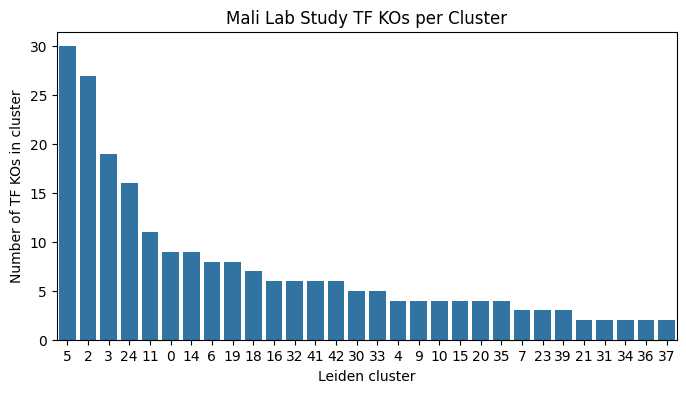

In [ ]:
_ = plot_reordered_cluster_summary(mali_clusters_reordered, mali_columns_reordered, 
                                   "Mali Lab Study TF KOs per Cluster")

In [ ]:
jaccard_deg_mali_reordered, intersection_deg_mali_reordered = \
    compare_cluster_dfs(clusters_5087_8, "DEG", mali_clusters_reordered, "Mali_r")

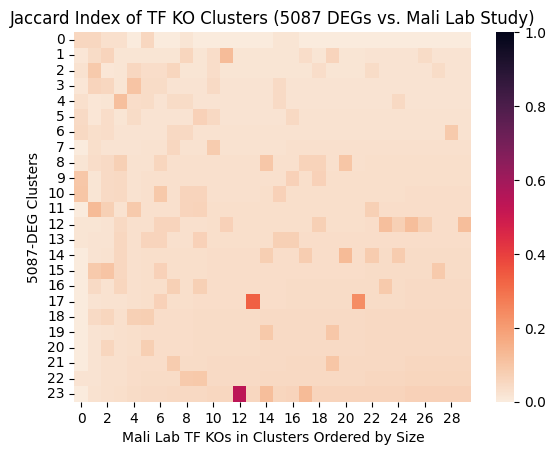

In [ ]:
p = cluster_heatmap(jaccard_deg_mali_reordered, rows_name="5087-DEG Clusters", cols_name="Mali Lab TF KOs in Clusters Ordered by Size",
    title="Jaccard Index of TF KO Clusters (5087 DEGs vs. Mali Lab Study)", v_min=0, v_max=1, color_map="rocket_r")

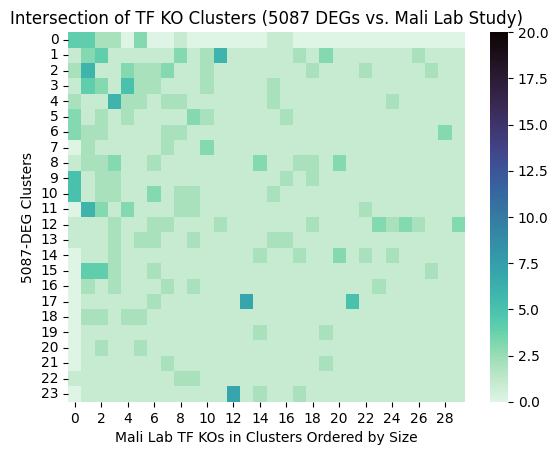

In [ ]:
p = cluster_heatmap(intersection_deg_mali_reordered, rows_name="5087-DEG Clusters", cols_name="Mali Lab TF KOs in Clusters Ordered by Size",
    title="Intersection of TF KO Clusters (5087 DEGs vs. Mali Lab Study)", v_min=0, v_max=20, color_map="mako_r")

In [ ]:
jaccard_hvg_mali_reordered, intersection_hvg_mali_reordered = \
    compare_cluster_dfs(clusters_2000_8, "HVG", mali_clusters_reordered, "Mali_r")

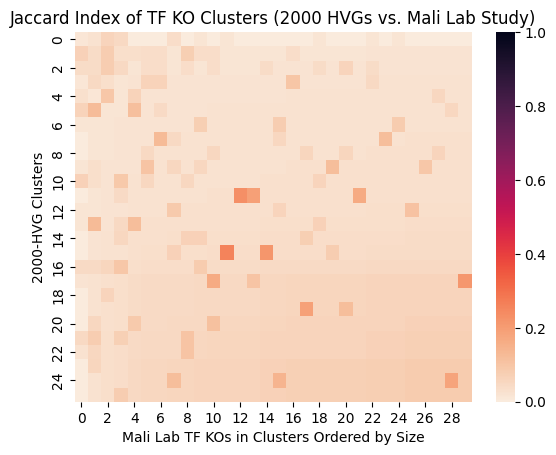

In [ ]:
p = cluster_heatmap(jaccard_hvg_mali_reordered, rows_name="2000-HVG Clusters", cols_name="Mali Lab TF KOs in Clusters Ordered by Size",
    title="Jaccard Index of TF KO Clusters (2000 HVGs vs. Mali Lab Study)", v_min=0, v_max=1, color_map="rocket_r")

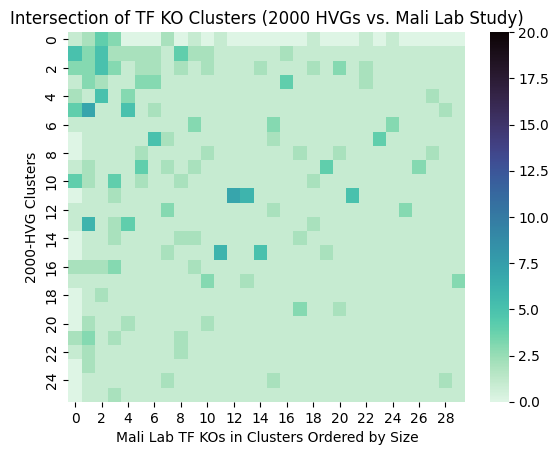

In [ ]:
p = cluster_heatmap(intersection_hvg_mali_reordered, rows_name="2000-HVG Clusters", cols_name="Mali Lab TF KOs in Clusters Ordered by Size",
    title="Intersection of TF KO Clusters (2000 HVGs vs. Mali Lab Study)", v_min=0, v_max=20, color_map="mako_r")